---
# Introduction

---

**Problem Statement:**

* Whether out at a restaurant or buying tickets to a concert, modern life counts on the convenience of a credit card to make daily purchases. It saves us from carrying large amounts of cash and also can advance a full purchase that can be paid over time.
* How do card issuers know we’ll pay back what we charge? That’s a complex problem with many existing solutions—and even more potential improvements, to be explored in this competition.
* Credit default prediction is central to managing risk in a consumer lending business. 
 * Credit default prediction allows lenders to optimize lending decisions, which leads to a better customer experience and sound business economics. 
* Current models exist to help manage risk. But it's possible to create better models that can outperform those currently in use.

* The objective of this competition is to predict the probability that a customer does not pay back their credit card balance amount in the future based on their monthly customer profile. 
 * The target binary variable is calculated by observing 18 months performance window after the latest credit card statement, and if the customer does not pay due amount in 120 days after their latest statement date it is considered a default event.

---
**Importing Libraries:**
* To get started we will use Python for data pre-processing and data analysis.
* Import python libraries as necessary to get started for data load and later import other libraries as needed
---

In [4]:
import numpy as np 
# data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd 
# data processing, CSV file I/O (e.g. dd.read_csv)
import dask
import dask.dataframe as dd
# module finds all the pathnames matching a specified pattern
import glob 
import os
# Importing pyplot interface using matplotlib
import matplotlib.pyplot as plt 
# Importing seaborn library for interactive visualization
import seaborn as sns 
# Importing WordCloud for text data visualization
from wordcloud import WordCloud
# Importing matplotlib for plots
import matplotlib
# Importing datetime for using datetime
from datetime import datetime
# Importing plotly for interactive plots
import plotly.express as px
# Importing missingno for missing value plot
#import missingno as msno
# importing regex library for use of regex
import re

---
# Dataset Load/Data Display
---

**Dataset:**

* **train_data.csv** - training data with multiple statement dates per customer_ID
* **train_labels.csv** - target label for each customer_ID
* **test_data.csv** - corresponding test data; objective is to predict the target label for each customer_ID
* **sample_submission.csv** - a sample submission file in the correct format

---

Let us check size of dataset CSV file

In [1]:
#This code is used to display the size of CSV files in the input directory of a Kaggle notebook. '
#It defines a function `convert_bytes` that converts file sizes from bytes to KB, MB, GB, or TB. 
#The code then walks through the input directory, retrieves the size of each CSV file, 
#and prints the file path along with its size in a human-readable format.

# thi code doesnt reduce the size of the file a lot and only reduce the size of the file by 1%.

# calculate file size in KB, MB, GB
def convert_bytes(size):
    """ Convert bytes to KB, or MB or GB"""
    for x in ['bytes', 'KB', 'MB', 'GB', 'TB']:
        if size < 1024.0:
            return "%3.1f %s" % (size, x)
        size /= 1024.0

# display CSV file with size
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        csvfile=os.path.join(dirname, filename)
        csvfilesize = os.path.getsize(csvfile)
        filesize = convert_bytes(csvfilesize)
        print(f'{csvfile} size is', filesize, 'bytes')

NameError: name 'os' is not defined

In [6]:
# Loading dataset train_data.csv using dask
#train_dask_df = dd.read_csv('../input/amex-default-prediction/train_data.csv',blocksize="10MB")


# Step 1: Read .ftr file using pandas
df_pandas = pd.read_feather("train_data.ftr")

# Step 2: Convert to Dask DataFrame
train_dask_df = dd.from_pandas(df_pandas, npartitions=80)

In [7]:
# get shape of dataframe
print('Number of rows is:', train_dask_df.shape[0].compute())
# print summary of dataframe
train_dask_df.info()

Number of rows is: 5531451
<class 'dask.dataframe.core.DataFrame'>
Columns: 191 entries, customer_ID to target
dtypes: category(1), category(1), category(1), category(1), category(1), category(1), category(4), category(1), datetime64[ns](1), float16(177), int64(1), string(1)

---
Considering large number of rows around 5.5 million in **train_data.csv** dataset, using nrows option to load first 100k rows from dataset file for EDA purpose.

---

In [8]:
del train_dask_df

Load train_data.csv dataset file using nrows=100000

In [ ]:
# Loading dataset train_data.csv
train_df = pd.read_csv('../input/amex-default-prediction/train_data.csv', nrows=100000)

In [7]:
# get shape of dataframe
print('Shape of dataset is:', train_df.shape)

# print summary of dataframe
#train_df.info(verbose=True)
train_df.info()

Shape of dataset is: (100000, 190)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 190 entries, customer_ID to D_145
dtypes: float64(185), int64(1), object(4)
memory usage: 145.0+ MB


**Observations:**

* There are total 190 variables in train_data.csv dataset
    * There are 185 variables(Columns) as dtype float64, 1 variable(Column) as dtype int64 and 4 variables(Columns) as dtype object

---
**Q: What does data look like for train_data.csv?**

---

In [8]:
# print last 10 rows of dataframe
train_df.head(10)

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-03-09,0.938469,0.001733,0.008724,1.006838,0.009228,0.124035,0.008771,0.004709,...,NaN,NaN,NaN,0.002427,0.003706,0.003818,NaN,0.000569,0.000610,0.002674
1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,0.002714,...,NaN,NaN,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217
2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,0.009423,...,NaN,NaN,NaN,0.003269,0.007329,0.000427,NaN,0.003429,0.006986,0.002603
3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-06-13,0.960384,0.002455,0.013683,1.002700,0.001373,0.117169,0.000685,0.005531,...,NaN,NaN,NaN,0.006117,0.004516,0.003200,NaN,0.008419,0.006527,0.009600
4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-07-16,0.947248,0.002483,0.015193,1.000727,0.007605,0.117325,0.004653,0.009312,...,NaN,NaN,NaN,0.003671,0.004946,0.008889,NaN,0.001670,0.008126,0.009827
5,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-08-04,0.945964,0.001746,0.007863,1.005006,0.004220,0.110946,0.009857,0.009866,...,NaN,NaN,NaN,0.001924,0.008598,0.004529,NaN,0.000674,0.002223,0.002884
6,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-09-18,0.940705,0.002183,0.018859,1.008024,0.004509,0.103329,0.006603,0.000783,...,NaN,NaN,NaN,0.001336,0.004361,0.009387,NaN,0.007727,0.007661,0.002225
7,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-10-08,0.914767,0.003029,0.014324,1.000242,0.000263,0.108115,0.009527,0.007836,...,NaN,NaN,NaN,0.002397,0.008452,0.005553,NaN,0.001831,0.009616,0.007385
8,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-11-20,0.950845,0.009896,0.016888,1.003995,0.001789,0.102792,0.002519,0.009817,...,NaN,NaN,NaN,0.009742,0.003968,0.007945,NaN,0.008722,0.004369,0.000995
9,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-12-04,0.868580,0.001082,0.001930,1.007504,0.001772,0.100470,0.004626,0.006073,...,NaN,NaN,NaN,0.003611,0.009607,0.007266,NaN,0.008763,0.004753,0.009068


In [9]:
# print last 10 rows of dataframe
train_df.tail(10)

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
99990,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-08-30,0.384909,0.035318,0.458354,0.041028,0.003607,0.160012,0.001647,0.310214,...,NaN,NaN,NaN,0.005062,0.003982,0.001922,NaN,0.006305,0.005671,0.005176
99991,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-09-07,0.393865,0.031264,0.475851,0.020916,0.000956,0.158441,0.009886,0.539013,...,NaN,NaN,NaN,0.006297,0.000249,0.006963,NaN,0.004721,0.005292,0.007771
99992,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-10-30,0.404945,0.037288,0.517886,0.024682,0.009429,NaN,0.001787,0.599980,...,NaN,NaN,NaN,0.004464,0.002012,0.001697,NaN,0.003873,0.008324,0.003467
99993,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-11-29,0.435756,0.031057,0.482063,0.027948,0.009905,NaN,0.003934,0.626399,...,NaN,NaN,NaN,0.001463,0.004270,0.008026,NaN,0.004173,0.007607,0.007898
99994,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-12-28,0.460773,0.002773,0.566310,0.024067,0.001911,0.163969,0.009347,0.635597,...,NaN,NaN,NaN,0.002085,0.007212,0.007473,NaN,0.002539,0.004214,0.009974
99995,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2018-01-02,0.458911,0.124405,0.597829,0.023698,0.004703,0.162860,0.000963,0.627714,...,NaN,NaN,NaN,0.004281,0.003969,0.003936,NaN,0.006478,0.003046,0.004138
99996,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2018-02-27,0.363298,0.038383,0.675999,0.023201,0.006627,0.160133,0.000720,0.822903,...,NaN,NaN,NaN,0.004239,0.008563,0.003117,NaN,0.006679,0.007450,0.002982
99997,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2018-03-08,0.356621,0.036849,0.645728,0.020585,0.004587,0.166246,0.003972,0.871214,...,NaN,NaN,NaN,0.009920,0.005579,0.008481,NaN,0.001516,0.005997,0.004767
99998,049e0948e285ec6767bf07e6e3f5e0919821ee200e359d...,2017-03-29,0.714477,0.000546,0.008019,0.817670,0.006265,NaN,0.008652,0.008341,...,NaN,NaN,NaN,1.006665,0.003085,0.914985,0.351957,1.001686,0.579711,0.454960
99999,049e0948e285ec6767bf07e6e3f5e0919821ee200e359d...,2017-04-28,0.614861,0.008513,0.008796,0.813174,0.008680,NaN,0.002812,0.009391,...,NaN,NaN,NaN,1.006981,0.003211,0.914737,0.356866,1.001302,0.669118,0.460121


**Observations:**

* customer_ID has encrypted value
* S_2 variable has date as value
* S_3 and few D variables appears to have missing value

---
Considering high number of variables, need to extract names of variable for easy access.

---

In [10]:
# Lets extract columns names for easy access
D_columns = [col for col in train_df.columns if 'D_' in col]
print ("Total number of columns starting with D is", len(D_columns))
print("###############################")
# segregate D Columns for easier access using regex
# regex to capture column name with D_$$ (D_ and 2 digit number suffix)
d_col1 = "D_[0-9][0-9]$$"
# regex to capture column name with D_$$$ (D_ and 3 digit number suffix)
d_col2 = "D_[0-9][0-9][0-9]$$$"
# get first set of column name which matches regex for d_col1
D_columns1 = [col for col in train_df.columns if re.match(d_col1,col)]
print ("First set of columns starting with D is", len(D_columns1))
print(D_columns1)
# get second set of column name which matches regex for d_col2
D_columns2 = [col for col in train_df.columns if re.match(d_col2,col)]
print ("Second set of columns starting with D is", len(D_columns2))
print(D_columns2)
print ("Total Number of columns starting with D is", len(D_columns2)+len(D_columns1))
print("###############################")
S_columns = [col for col in train_df.columns if 'S_' in col]
print ("Total number of columns starting with S is", len(S_columns))
print(S_columns)
print("###############################")
P_columns = [col for col in train_df.columns if 'P_' in col]
print ("Total number of columns starting with P is", len(P_columns))
print(P_columns)
print("###############################")
B_columns = [col for col in train_df.columns if 'B_' in col]
print ("Total number of columns starting with B is", len(B_columns))
print(B_columns)
print("###############################")
R_columns = [col for col in train_df.columns if 'R_' in col]
print ("Toal number of columns starting with R is", len(R_columns))
print(R_columns)
print("###############################")
total_columns = len(D_columns1)+len(D_columns2)+len(S_columns)+len(P_columns)+len(B_columns)+len(R_columns)
print("Total number of D, S, P, B, R variables(columns) per customer_ID  is",total_columns)
print("###############################")

Total number of columns starting with D is 96
###############################
First set of columns starting with D is 52
['D_39', 'D_41', 'D_42', 'D_43', 'D_44', 'D_45', 'D_46', 'D_47', 'D_48', 'D_49', 'D_50', 'D_51', 'D_52', 'D_53', 'D_54', 'D_55', 'D_56', 'D_58', 'D_59', 'D_60', 'D_61', 'D_62', 'D_63', 'D_64', 'D_65', 'D_66', 'D_68', 'D_69', 'D_70', 'D_71', 'D_72', 'D_73', 'D_74', 'D_75', 'D_76', 'D_77', 'D_78', 'D_79', 'D_80', 'D_81', 'D_82', 'D_83', 'D_84', 'D_86', 'D_87', 'D_88', 'D_89', 'D_91', 'D_92', 'D_93', 'D_94', 'D_96']
Second set of columns starting with D is 44
['D_102', 'D_103', 'D_104', 'D_105', 'D_106', 'D_107', 'D_108', 'D_109', 'D_110', 'D_111', 'D_112', 'D_113', 'D_114', 'D_115', 'D_116', 'D_117', 'D_118', 'D_119', 'D_120', 'D_121', 'D_122', 'D_123', 'D_124', 'D_125', 'D_126', 'D_127', 'D_128', 'D_129', 'D_130', 'D_131', 'D_132', 'D_133', 'D_134', 'D_135', 'D_136', 'D_137', 'D_138', 'D_139', 'D_140', 'D_141', 'D_142', 'D_143', 'D_144', 'D_145']
Total Number of colum

---
**Q: What does data look like for D Variables?**

---

In [11]:
# display data for columns starting with D
train_df.filter(like='D_', axis=1)

,D_39,D_41,D_42,D_43,D_44,D_45,D_46,D_47,D_48,D_49,...,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
0,0.001733,0.008771,NaN,NaN,0.000630,0.708906,0.358587,0.525351,0.255736,NaN,...,NaN,NaN,NaN,0.002427,0.003706,0.003818,NaN,0.000569,0.000610,0.002674
1,0.005775,0.000798,NaN,NaN,0.002526,0.712795,0.353630,0.521311,0.223329,NaN,...,NaN,NaN,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217
2,0.091505,0.007598,NaN,NaN,0.007605,0.720884,0.334650,0.524568,0.189424,NaN,...,NaN,NaN,NaN,0.003269,0.007329,0.000427,NaN,0.003429,0.006986,0.002603
3,0.002455,0.000685,NaN,NaN,0.006406,0.723997,0.323271,0.530929,0.135586,NaN,...,NaN,NaN,NaN,0.006117,0.004516,0.003200,NaN,0.008419,0.006527,0.009600
4,0.002483,0.004653,NaN,NaN,0.007731,0.720619,0.231009,0.529305,NaN,NaN,...,NaN,NaN,NaN,0.003671,0.004946,0.008889,NaN,0.001670,0.008126,0.009827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0.124405,0.000963,NaN,0.120353,0.252120,0.053603,0.559376,0.418322,0.622826,NaN,...,NaN,NaN,NaN,0.004281,0.003969,0.003936,NaN,0.006478,0.003046,0.004138
99996,0.038383,0.000720,NaN,0.058647,0.508251,0.058924,0.644493,0.422213,0.685554,NaN,...,NaN,NaN,NaN,0.004239,0.008563,0.003117,NaN,0.006679,0.007450,0.002982
99997,0.036849,0.003972,NaN,0.059105,0.626476,0.065946,0.743611,0.420412,0.755215,NaN,...,NaN,NaN,NaN,0.009920,0.005579,0.008481,NaN,0.001516,0.005997,0.004767
99998,0.000546,0.008652,NaN,0.276448,0.125936,0.089861,0.437422,0.169624,0.376802,NaN,...,NaN,NaN,NaN,1.006665,0.003085,0.914985,0.351957,1.001686,0.579711,0.454960


**Observations:**

* There are many D variables with missing value
* There are many D variables with either 0 or 1 value

---
**Q: What does data look like for S Variables?**

---

In [12]:
# display data for columns starting with S
train_df.filter(like='S_', axis=1)

,S_2,S_3,S_5,S_6,S_7,S_8,S_9,S_11,S_12,S_13,...,S_17,S_18,S_19,S_20,S_22,S_23,S_24,S_25,S_26,S_27
0,2017-03-09,0.124035,0.023381,0.008322,0.161345,0.922998,0.065728,0.401619,0.272008,0.515222,...,0.008033,0.005720,0.002537,0.009705,0.894090,0.135561,0.911191,0.974539,0.001243,0.676922
1,2017-04-07,0.126750,0.030599,0.002482,0.140951,0.919414,0.093935,0.406326,0.188970,0.509048,...,0.000760,0.007584,0.008427,0.009924,0.902135,0.136333,0.919876,0.975624,0.004561,0.822281
2,2017-05-28,0.123977,0.048367,0.000530,0.112229,1.001977,0.084757,0.406768,0.495308,0.679257,...,0.004056,0.005901,0.007327,0.008446,0.939654,0.134938,0.958699,0.974067,0.011736,0.853498
3,2017-06-13,0.117169,0.030063,0.000783,0.102838,0.704016,0.048382,0.405175,0.508670,0.515282,...,0.006969,0.002520,0.007053,0.006614,0.913205,0.140058,0.926341,0.975499,0.007571,0.844667
4,2017-07-16,0.117325,0.054221,0.006698,0.094311,0.917133,0.039259,0.487460,0.216507,0.507712,...,0.001770,0.000155,0.007728,0.005511,0.921026,0.131620,0.933479,0.978027,0.018200,0.811199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,2018-01-02,0.162860,0.003671,1.003519,0.106078,0.664955,NaN,0.483669,0.185748,0.426306,...,0.004245,0.006308,0.002001,0.002984,0.927312,0.136109,0.934297,0.973335,0.008895,0.000456
99996,2018-02-27,0.160133,0.004589,0.009121,0.102220,0.004212,NaN,0.284908,0.184445,0.000856,...,0.007683,0.003194,0.007621,0.002146,0.927598,0.139274,0.934902,0.975162,0.003994,0.008081
99997,2018-03-08,0.166246,0.005730,0.009046,0.102649,0.007804,NaN,0.286198,0.185529,0.001797,...,0.005782,0.009422,0.008363,0.002412,0.923396,0.137267,0.932529,0.972051,0.005734,0.003518
99998,2017-03-29,NaN,0.001485,1.009798,NaN,0.009353,NaN,0.281242,0.188374,0.001410,...,0.007239,0.007558,0.007195,0.006557,0.296741,0.135450,0.080604,0.969829,0.001976,NaN


**Observations:**

* S_2 variable has date value
* S_3, S_9 and S_27 variable appears to have missing value

---
**Q: What does data look like for P Variables?**

---

In [13]:
# display data for columns starting with P
train_df.filter(like='P_', axis=1)

,P_2,P_3,P_4
0,0.938469,0.736463,0.007554
1,0.936665,0.720886,0.004832
2,0.954180,0.738044,0.006561
3,0.960384,0.741813,0.009559
4,0.947248,0.691986,0.008156
...,...,...,...
99995,0.458911,0.800521,0.002580
99996,0.363298,0.455359,0.000531
99997,0.356621,0.525428,0.000818
99998,0.714477,0.914447,0.002444


**Observations:**

* P_2 variable appears to have values towards 1
* P_4 variable appears to have values towards 0

---
**Q: What does data look like for B Variables?**

---

In [14]:
# display data for columns starting with B
train_df.filter(like='B_', axis=1)

,B_1,B_2,B_3,B_4,B_5,B_6,B_7,B_8,B_9,B_10,...,B_31,B_32,B_33,B_36,B_37,B_38,B_39,B_40,B_41,B_42
0,0.008724,1.006838,0.004709,0.080986,0.170600,0.063902,0.059416,0.006466,0.008207,0.096219,...,1,0.006626,1.001101,0.009968,0.004572,2.0,NaN,0.210060,0.006805,NaN
1,0.004923,1.000653,0.002714,0.069419,0.113239,0.065261,0.057744,0.001614,0.008373,0.099804,...,1,0.001854,1.006779,0.003921,0.004654,2.0,NaN,0.184093,0.004407,NaN
2,0.021655,1.009672,0.009423,0.068839,0.060492,0.066982,0.056647,0.005126,0.009355,0.134073,...,1,0.008686,1.001014,0.001264,0.019176,2.0,NaN,0.154837,0.003221,NaN
3,0.013683,1.002700,0.005531,0.055630,0.166782,0.083720,0.049253,0.001418,0.006782,0.134437,...,1,0.002478,1.002775,0.002729,0.011720,2.0,NaN,0.153939,0.007703,NaN
4,0.015193,1.000727,0.009312,0.038862,0.143630,0.075900,0.048918,0.001199,0.000519,0.121518,...,1,0.002199,1.006536,0.009998,0.017598,2.0,NaN,0.120717,0.009823,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0.597829,0.023698,0.627714,0.360951,0.011009,0.011536,0.521920,1.005980,0.625836,0.018762,...,1,1.006581,0.009367,0.007672,0.594097,7.0,NaN,0.279545,0.007559,NaN
99996,0.675999,0.023201,0.822903,0.406486,0.013573,0.013677,0.524812,1.004071,0.620252,0.008919,...,1,0.001145,0.004368,0.003274,0.674203,6.0,NaN,0.306964,0.006966,NaN
99997,0.645728,0.020585,0.871214,0.398912,0.007250,0.007949,0.528713,1.002330,0.615262,0.018506,...,1,0.002013,0.000287,0.006013,0.650203,6.0,NaN,0.310772,0.001757,NaN
99998,0.008019,0.817670,0.008341,0.356096,0.001831,0.043211,0.356317,1.003488,0.003620,0.016049,...,1,0.002254,1.004854,0.004141,0.000765,1.0,NaN,0.250556,0.006677,NaN


**Observations:**

* B_39 and B_42 appears to have missing value
* B_31 appears to have majority of value as 1

---
**Q: What does data look like for R Variables?**

---

In [15]:
# display data for columns starting with R
train_df.filter(like='R_', axis=1)

,R_1,R_2,R_3,R_4,R_5,R_6,R_7,R_8,R_9,R_10,...,R_19,R_20,R_21,R_22,R_23,R_24,R_25,R_26,R_27,R_28
0,0.009228,0.006204,0.001423,0.008298,0.001882,0.008363,0.007562,0.001434,NaN,0.007121,...,0.005177,0.007782,0.002450,0.007479,0.006893,0.003950,0.003647,NaN,1.008949,0.001535
1,0.006151,0.006206,0.001984,0.005136,0.001610,0.004030,0.005304,0.000509,NaN,0.005966,...,0.008979,0.005987,0.002247,0.006827,0.002837,0.008351,0.008850,NaN,1.003205,0.004931
2,0.006815,0.003259,0.007426,0.006961,0.006328,0.006838,0.001422,0.008295,NaN,0.005447,...,0.002016,0.007291,0.007794,0.009820,0.005080,0.002471,0.009769,NaN,1.000754,0.009123
3,0.001373,0.009918,0.003515,0.008706,0.004980,0.008183,0.006363,0.005153,NaN,0.001888,...,0.003909,0.009977,0.007686,0.000458,0.007320,0.008507,0.004858,NaN,1.005338,0.002409
4,0.007605,0.006667,0.001362,0.003846,0.001653,0.008605,0.004831,0.007338,NaN,0.006111,...,0.003432,0.004105,0.009656,0.003341,0.000264,0.007190,0.002983,NaN,1.003175,0.004462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0.004703,0.002830,0.001867,0.005602,0.001917,0.006611,0.003722,0.000094,NaN,0.001921,...,0.008637,0.006685,0.000638,0.001164,0.003237,0.008689,0.005586,NaN,1.007739,0.000816
99996,0.006627,0.000854,0.007511,0.000665,0.000468,0.008671,0.004958,0.008745,NaN,0.003169,...,0.008926,0.002764,0.000135,0.001748,0.005861,0.008008,0.000410,NaN,1.008753,0.001219
99997,0.004587,0.003531,0.009798,0.006756,0.007217,0.008475,0.001212,0.008836,NaN,0.004486,...,0.007011,0.005289,0.008655,0.002177,0.007047,0.003928,0.002760,NaN,1.005128,0.009029
99998,0.006265,0.009700,0.201372,0.000607,0.003720,0.003783,0.007968,0.008976,NaN,0.006302,...,0.001292,0.004610,0.001527,0.000086,0.002535,0.003271,0.005793,NaN,1.008218,0.007641


**Observations:**

* R_9 and R_26 appears to have missing value
* R_27 appears to have majority value as 1

---
Need to load **train_labels.csv** for customer_ID with target label for Default as True(1) and False(0) (Default=1 and Not Default=0)

---

In [16]:
# Loading dataset train_labels.csv
train_label_df = pd.read_csv('../input/amex-default-prediction/train_labels.csv')

In [17]:
# get shape of dataframe
print('Shape of dataset is:', train_label_df.shape)

# print summary of dataframe
train_label_df.info()

Shape of dataset is: (458913, 2)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 458913 entries, 0 to 458912
Data columns (total 2 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   customer_ID  458913 non-null  object
 1   target       458913 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 7.0+ MB


**Observations:**

* There are total 458,913 entries for target label with customer_ID
* There is variable (column) customer_ID which has dtype as object and variable (column) target which has dtype as int64

---
**Q: What does data look like for train_labels.csv?**

---

In [18]:
# print first 10 rows of dataframe
train_label_df.head(10)

,customer_ID,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0
1,00000fd6641609c6ece5454664794f0340ad84dddce9a2...,0
2,00001b22f846c82c51f6e3958ccd81970162bae8b007e8...,0
3,000041bdba6ecadd89a52d11886e8eaaec9325906c9723...,0
4,00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8a...,0
5,000084e5023181993c2e1b665ac88dbb1ce9ef621ec537...,0
6,000098081fde4fd64bc4d503a5d6f86a0aedc425c96f52...,0
7,0000d17a1447b25a01e42e1ac56b091bb7cbb06317be4c...,0
8,0000f99513770170a1aba690daeeb8a96da4a39f11fc27...,1
9,00013181a0c5fc8f1ea38cd2b90fe8ad2fa8cad9d9f13e...,1


In [19]:
# print last 10 rows of dataframe
train_label_df.tail(10)

,customer_ID,target
458903,fffec7d7e1ca804c86f1ffdaac389c33f8039ed35bf412...,0
458904,fffee056e120fb326c9413fca5a7ab6618cc49be9bb6b1...,0
458905,fffee847c5c1af7dbdd36d98fea882893256c422cde86c...,0
458906,fffef3305f19a11fb6c15f4ebe9be1bd664540e57c0a6a...,0
458907,ffff39cc22a375d07369980d02d617883dd28ad81a6aa3...,0
458908,ffff41c8a52833b56430603969b9ca48d208e7c192c6a4...,0
458909,ffff518bb2075e4816ee3fe9f3b152c57fc0e6f01bf7fd...,0
458910,ffff9984b999fccb2b6127635ed0736dda94e544e67e02...,0
458911,ffffa5c46bc8de74f5a4554e74e239c8dee6b9baf38814...,1
458912,fffff1d38b785cef84adeace64f8f83db3a0c31e8d92ea...,0


---
**Q: What is the distribution of target label?**

---

In [20]:
# distribution count of target variable
train_label_df['target'].value_counts()

0    340085
1    118828
Name: target, dtype: int64

In [21]:
# plot percentage of distribution count for target variable
fig = px.pie(train_label_df, names='target')
fig.show()

**Observation:**

* Sample dataset has target=1(Default) around 25.9% and target=0(Not Default) around 74.1% (data imbalance exist).

---
Using nrows option to load first 100k rows from **test_data.csv** dataset file.

---

In [22]:
# Loading dataset test_data.csv
test_df = pd.read_csv('../input/amex-default-prediction/test_data.csv', nrows=100000)

In [23]:
# get shape of dataframe
print('Shape of dataset is:', test_df.shape)

# print summary of dataframe
#test_df.info(verbose=True)
test_df.info()

Shape of dataset is: (100000, 190)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 190 entries, customer_ID to D_145
dtypes: float64(185), int64(1), object(4)
memory usage: 145.0+ MB


**Observation:**

* There are 185 variables(Columns) as dtype float64, 1 variable(Column) as dtype int64 and 4 variables(Columns) as dtype object, same structure as train_data.csv

---
**Q: What does data look like for test_data.csv?**

---

In [24]:
# print first 10 rows of dataframe
test_df.head(10)

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
0,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-02-19,0.631315,0.001912,0.010728,0.814497,0.007547,0.168651,0.009971,0.002347,...,NaN,NaN,NaN,NaN,0.004669,NaN,NaN,NaN,0.008281,NaN
1,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-03-25,0.587042,0.005275,0.011026,0.810848,0.001817,0.241389,0.000166,0.009132,...,NaN,NaN,NaN,0.000142,0.004940,0.009021,NaN,0.003695,0.003753,0.001460
2,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-04-25,0.609056,0.003326,0.016390,1.004620,0.000114,0.266976,0.004196,0.004192,...,NaN,NaN,NaN,0.000074,0.002114,0.004656,NaN,0.003155,0.002156,0.006482
3,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-05-20,0.614911,0.009065,0.021672,0.816549,0.009722,0.188947,0.004123,0.015325,...,NaN,NaN,NaN,0.004743,0.006392,0.002890,NaN,0.006044,0.005206,0.007855
4,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-06-15,0.591673,0.238794,0.015923,0.810456,0.002026,0.180035,0.000731,0.011281,...,NaN,NaN,NaN,0.008133,0.004329,0.008384,NaN,0.001008,0.007421,0.009471
5,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-07-13,0.587472,0.005827,0.007959,1.001009,0.008814,0.173701,0.000653,0.009779,...,NaN,NaN,NaN,0.007001,0.003962,0.005530,NaN,0.009870,0.009667,0.005398
6,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-08-16,0.625006,0.238704,0.013420,0.816605,0.009849,0.170644,0.002495,0.019999,...,NaN,NaN,NaN,0.001132,0.007676,0.005410,NaN,0.006762,0.005664,0.002627
7,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-09-29,0.597074,0.003537,0.017426,1.000670,0.005143,0.158006,0.000985,0.011962,...,NaN,NaN,NaN,0.008730,0.000628,0.002821,NaN,0.004141,0.005733,0.005657
8,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-10-12,0.568930,0.121385,0.010779,1.009347,0.006923,0.149413,0.000396,0.003576,...,NaN,NaN,NaN,0.005912,0.001250,0.006543,NaN,0.009160,0.003690,0.003219
9,00001bf2e77ff879fab36aa4fac689b9ba411dae63ae39...,2018-04-22,0.894195,0.325657,0.020970,1.001803,0.005125,0.073243,0.005347,0.001597,...,NaN,NaN,NaN,0.008065,0.009861,0.009535,NaN,0.003964,0.008436,0.008323


---
Loading **sample_submission.csv** file just to get a glance :)

---

In [25]:
# Loading sample_submission.csv
sample_submission_df = pd.read_csv('../input/amex-default-prediction/sample_submission.csv')

In [26]:
# get shape of dataframe
print('Shape of dataset is:', sample_submission_df.shape)

# print summary of dataframe
sample_submission_df.info()

Shape of dataset is: (924621, 2)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 924621 entries, 0 to 924620
Data columns (total 2 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   customer_ID  924621 non-null  object
 1   prediction   924621 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 14.1+ MB


---
**Q: What does data look like for sample_submission.csv?**

---

In [27]:
# print first 10 rows of dataframe
sample_submission_df.head(10)

,customer_ID,prediction
0,00000469ba478561f23a92a868bd366de6f6527a684c9a...,0
1,00001bf2e77ff879fab36aa4fac689b9ba411dae63ae39...,0
2,0000210045da4f81e5f122c6bde5c2a617d03eef67f82c...,0
3,00003b41e58ede33b8daf61ab56d9952f17c9ad1c3976c...,0
4,00004b22eaeeeb0ec976890c1d9bfc14fd9427e98c4ee9...,0
5,00004ffe6e01e1b688170bbd108da8351bc4c316eacfef...,0
6,00007cfcce97abfa0b4fa0647986157281d01d3ab90de9...,0
7,000089cc2a30dad8e6ba39126f9d86df6088c9f975093a...,0
8,00008f50a1dd76fa211ba36a2b0d5a1b201e4134a5fd53...,0
9,0000b48a4f27dc1d61e78d081678e811620300b88eb3ab...,0


---
**Data Definition/Data Description**

---

The dataset contains aggregated profile features for each customer at each statement date.

Features are anonymized and normalized, and fall into the following general categories:

* **D_* = Delinquency variables**

* **S_* = Spend variables**

* **P_* = Payment variables**

* **B_* = Balance variables**

* **R_* = Risk variables**

with the following features being categorical:

**['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']**

In [28]:
# check for correlation threshold between D, S, P, B and R variables
# corr = train_df.corr(method='pearson')
# threshold = abs(corr)
# result = threshold[threshold>0.80]
# pd.set_option('display.max_columns', None)
# pd.set_option("max_rows", None)
# result

---
# D_* = Delinquency variables

---

---
**Summary of Dataframe for Delinquency variables**

---

In [29]:
#display summary of DataFrame for D variables
display(train_df[D_columns1].info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 52 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   D_39    100000 non-null  float64
 1   D_41    99963 non-null   float64
 2   D_42    14614 non-null   float64
 3   D_43    69805 non-null   float64
 4   D_44    94947 non-null   float64
 5   D_45    99963 non-null   float64
 6   D_46    78158 non-null   float64
 7   D_47    100000 non-null  float64
 8   D_48    87085 non-null   float64
 9   D_49    10238 non-null   float64
 10  D_50    43672 non-null   float64
 11  D_51    100000 non-null  float64
 12  D_52    99479 non-null   float64
 13  D_53    26756 non-null   float64
 14  D_54    99963 non-null   float64
 15  D_55    96698 non-null   float64
 16  D_56    45877 non-null   float64
 17  D_58    100000 non-null  float64
 18  D_59    98081 non-null   float64
 19  D_60    100000 non-null  float64
 20  D_61    89351 non-null   float64
 21  D_62    862

None

In [30]:
#display summary of DataFrame for D variables
display(train_df[D_columns2].info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 44 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   D_102   99274 non-null   float64
 1   D_103   98187 non-null   float64
 2   D_104   98187 non-null   float64
 3   D_105   45858 non-null   float64
 4   D_106   10130 non-null   float64
 5   D_107   98187 non-null   float64
 6   D_108   530 non-null     float64
 7   D_109   99958 non-null   float64
 8   D_110   634 non-null     float64
 9   D_111   634 non-null     float64
 10  D_112   99942 non-null   float64
 11  D_113   96784 non-null   float64
 12  D_114   96784 non-null   float64
 13  D_115   96784 non-null   float64
 14  D_116   96784 non-null   float64
 15  D_117   96784 non-null   float64
 16  D_118   96784 non-null   float64
 17  D_119   96784 non-null   float64
 18  D_120   96784 non-null   float64
 19  D_121   96784 non-null   float64
 20  D_122   96784 non-null   float64
 21  D_123   967

None

In [ ]:
train_raw[categorical_features].isna().sum().div(len(train_raw)).sort_values(ascending=False)

B_30     0.0
B_38     0.0
D_63     0.0
D_64     0.0
D_66     0.0
D_68     0.0
D_114    0.0
D_116    0.0
D_117    0.0
D_120    0.0
D_126    0.0
dtype: float64

**Observation:**

* D_63, D_64, D_66, D_68, D_114, D_116, D_117, D_120, D_126 are variables with categorical value but dtype is float64 excluding dtype for D_63 and D_64 variable which is object, rest of the variable are of dtype float64

---

**Descriptive statistics for Delinquency variables**

---

In [31]:
#display descriptive statistics
train_df[D_columns1].describe(include='all').T.sort_values('count', ascending=False)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
D_39,100000.0,NaN,NaN,NaN,0.154981,0.274231,0.000001,0.004566,0.009124,0.236827,5.33136
D_58,100000.0,NaN,NaN,NaN,0.217822,0.260974,0.0,0.005869,0.10876,0.377448,1.261522
D_94,100000.0,NaN,NaN,NaN,0.023021,0.133016,0.0,0.002573,0.005109,0.007621,1.009988
D_93,100000.0,NaN,NaN,NaN,0.013285,0.090713,0.0,0.002526,0.005041,0.007555,1.009994
D_92,100000.0,NaN,NaN,NaN,0.091541,0.293807,0.0,0.002716,0.005456,0.00816,2.009943
D_86,100000.0,NaN,NaN,NaN,0.039025,0.181315,0.0,0.002591,0.005165,0.007781,1.01
D_75,100000.0,NaN,NaN,NaN,0.173185,0.224468,0.0,0.006826,0.074607,0.26957,2.476351
D_71,100000.0,NaN,NaN,NaN,0.076136,0.361075,0.000008,0.008699,0.012984,0.033928,27.109726
D_65,100000.0,NaN,NaN,NaN,0.04051,0.322762,0.0,0.00262,0.005239,0.007877,34.242492
D_63,100000,6,CO,73774,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
#display descriptive statistics
train_df[D_columns2].describe(include='all').T.sort_values('count', ascending=False)

,count,mean,std,min,25%,50%,75%,max
D_127,100000.0,0.107571,0.303394,4.814436e-08,0.002803,0.005597,0.008350,1.009999
D_109,99958.0,0.006010,0.031745,2.626091e-08,0.002520,0.005025,0.007504,1.009924
D_112,99942.0,0.833810,0.375850,2.524918e-06,1.000949,1.003968,1.006988,1.010000
D_102,99274.0,0.192743,0.277148,3.221847e-07,0.004513,0.008966,0.331367,1.089969
D_140,99274.0,0.026072,0.143615,2.982034e-07,0.002556,0.005114,0.007677,1.009994
D_144,99267.0,0.055503,0.188772,1.161969e-07,0.002755,0.005507,0.008277,1.343284
D_133,99250.0,0.047773,0.175593,3.362575e-07,0.002706,0.005435,0.008203,1.509954
D_103,98187.0,0.472041,0.498930,1.025806e-09,0.004668,0.009392,1.004662,1.010000
D_143,98187.0,0.180681,0.380566,1.653580e-08,0.003018,0.006073,0.009089,1.010000
D_141,98187.0,0.166627,0.350497,5.642931e-08,0.003031,0.006062,0.009097,1.174753


**Observation:**

* Following D variables(columns) around 29 of them appears to have significant amount of missing values as per this sample dataset.

    * 
D_42,D_43,D_46,D_48,D_49,D_50,D_53,D_56,D_61,D_62,D_66,D_73,D_76,D_77,D_82,D_88,D_87,D_105,D_106,D_108,D_110,D_111,D_132,D_136,D_138,D_135,D_134,D_137,D_142 
* Majority of D Variables appears to have max value as 1.00
* There are D variables with outliers
* There are D variables with skewed distribution



---
**Q: What is the missing value plot for D Variable?**

---

<AxesSubplot:>

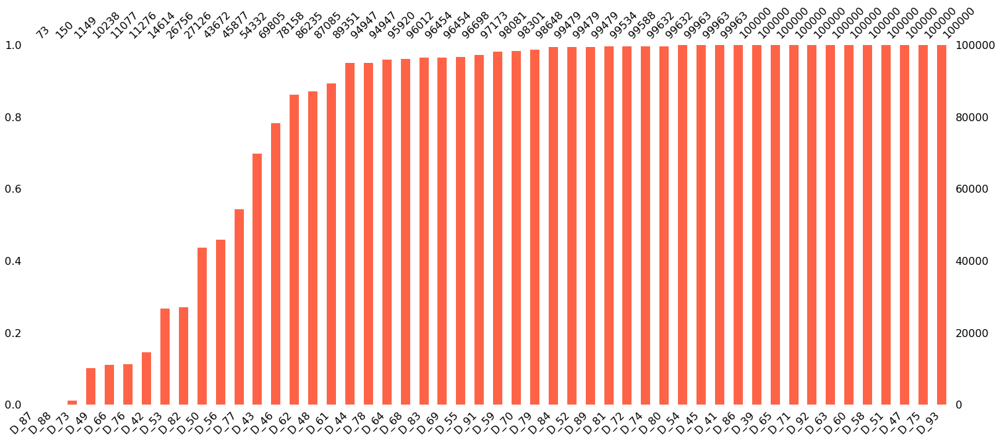

In [33]:
#plot of missing values
msno.bar(train_df[D_columns[:50]],figsize=(25,10),sort="ascending", color="tomato")

**Observation:**

* Above plot shows D variables which are having missing value and which are not having missing value

    * e.g., D_87,D_88 or D_73 variables has significant amount of missing value

<AxesSubplot:>

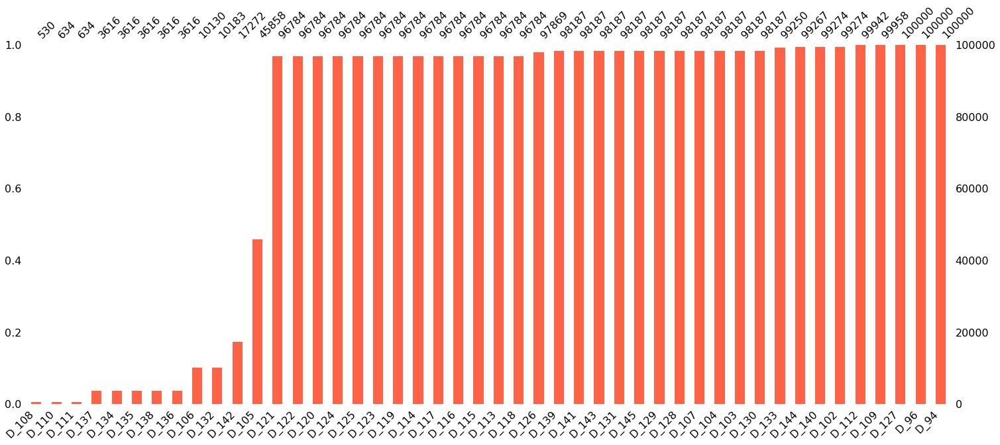

In [34]:
#plot of missing values
msno.bar(train_df[D_columns[50:]],figsize=(25,10),sort="ascending", color="tomato")

**Observation:**

* Above plot shows D variables which are having missing value and which are not having missing value

    * e.g., D_108, D_110 or D_111 variables has significant amount of missing value

---
**Q: What is the missing value relationship for D Variable?**

---

<AxesSubplot:>

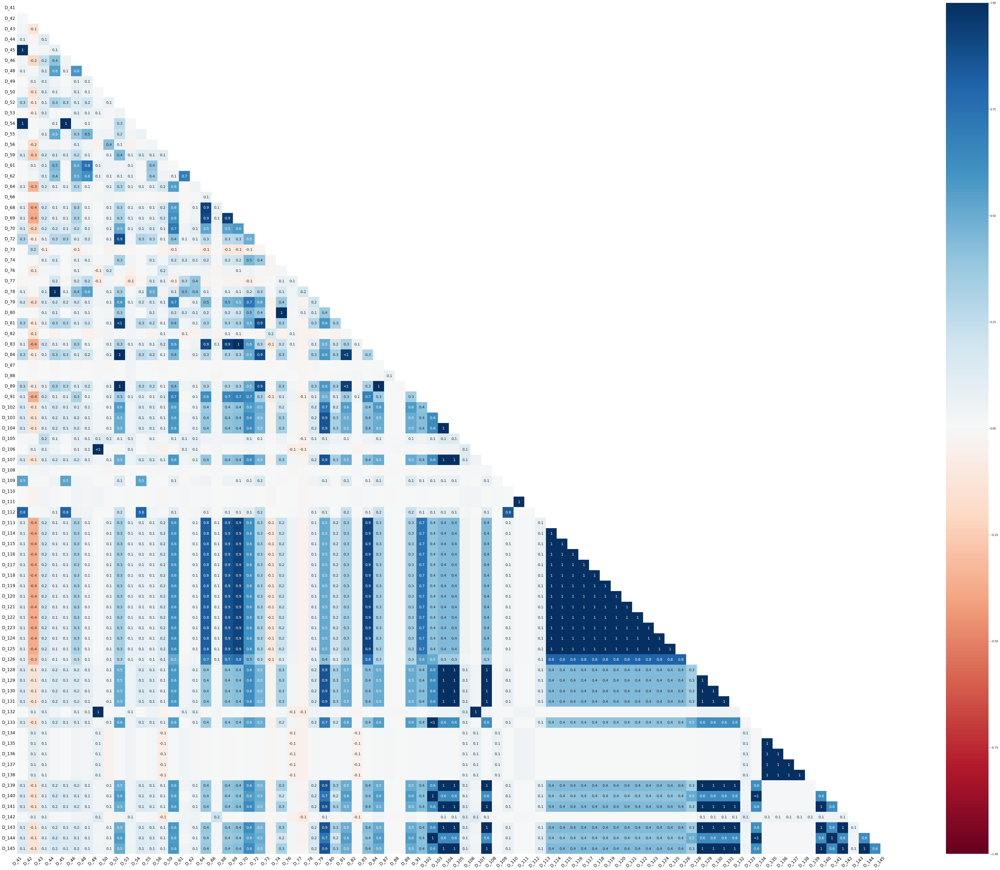

In [35]:
#plot of how missing values are related
msno.heatmap(train_df[D_columns],figsize=(75,60))

**Observation:**

* Above plot shows all the D variable which has missing value and also how they are related to other D variable for missing value.

    * e.g., missing value in D_49 variable is related to missing value in D_132 variable as they have relationship value of 1

---
**Q: What is the correlation for D Variable?**

---

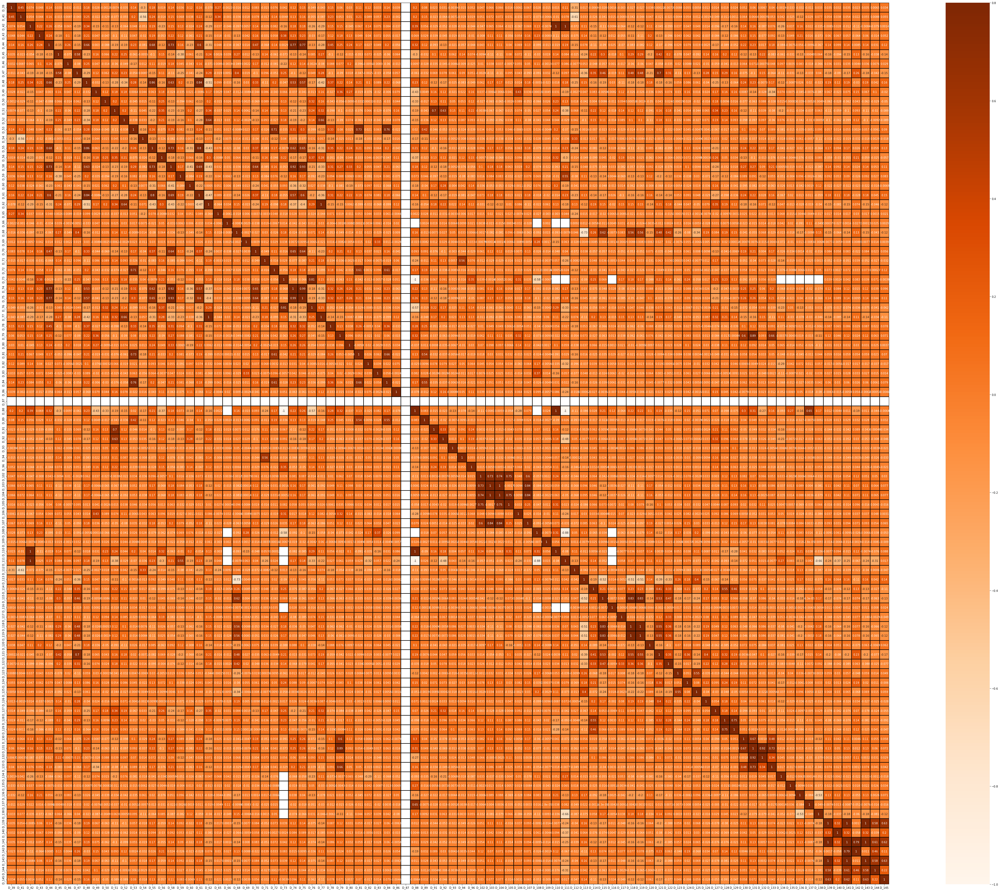

In [36]:
#plot correlation between D variables
corr = train_df[D_columns].corr(method='pearson')
plt.figure(figsize=(75,60))
# mask option can be used to not show values <=0.90
#sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='YlGnBu',linecolor ='black',mask = (np.abs(corr) <= 0.90))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Oranges',linecolor ='black')
plt.show()

**Observation:**

* D_42 has correlation of 1.0 with D_110 and D_111
* D_58 has correlation of 0.92 with D_74 and 0.93 with D_75
* D_62 has correlation of 1.0 with D_77
* D_74 has correlation of 0.99 with D_75
* D_73 has correlation of -1.0 with D_88
* D_139 has correlation of 1.0 with D_143 and D_141
* D_141 has correlation of 1.0 with D_143
* D_132 has correlation of 0.92 with D_132
* D_48 has correlation of 0.84 with D_55 and 0.86 with D_61
* D_79 has correlation of 0.89 with D_131

---
**Q: What is the distribution for D Variable?**

---

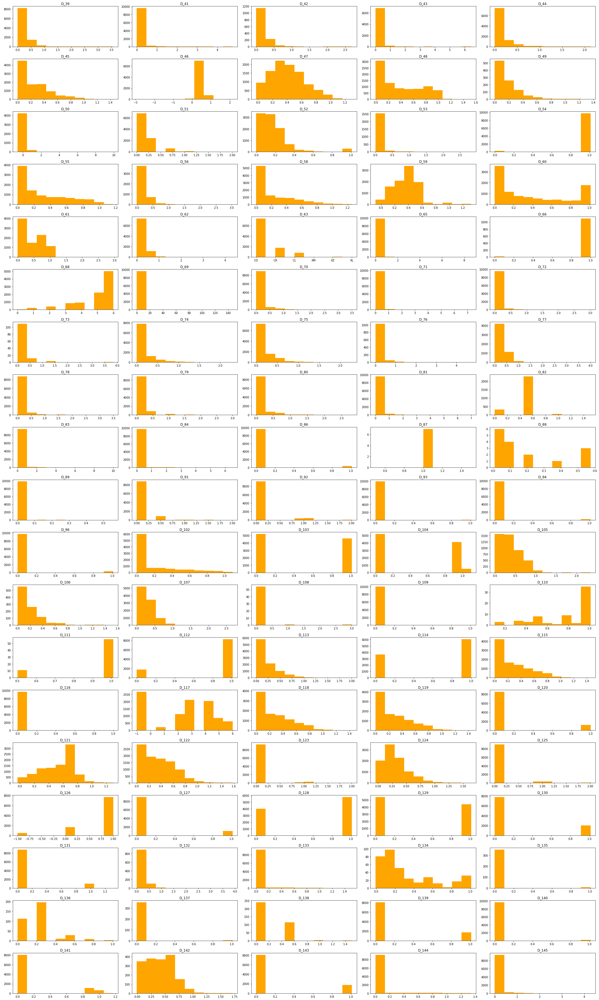

In [37]:
#plot distribution for D variables
nrows=19
ncols=5
fig, axes = plt.subplots(nrows, ncols, figsize=(30,50)) 
d_columns= ['D_39', 'D_41', 'D_42', 'D_43', 'D_44', 'D_45', 'D_46', 'D_47', 'D_48', 'D_49', 'D_50', 'D_51', 'D_52', 'D_53', 'D_54', 'D_55', 'D_56', 'D_58', 'D_59', 'D_60', 'D_61', 'D_62', 'D_63','D_65', 'D_66','D_68','D_69', 'D_70', 'D_71', 'D_72', 'D_73', 'D_74', 'D_75', 'D_76', 'D_77', 'D_78', 'D_79', 'D_80', 'D_81', 'D_82', 'D_83', 'D_84', 'D_86', 'D_87', 'D_88', 'D_89', 'D_91', 'D_92', 'D_93', 'D_94', 'D_96','D_102', 'D_103', 'D_104', 'D_105', 'D_106', 'D_107', 'D_108', 'D_109', 'D_110', 'D_111', 'D_112', 'D_113', 'D_114','D_115', 'D_116', 'D_117','D_118', 'D_119', 'D_120', 'D_121', 'D_122', 'D_123', 'D_124', 'D_125','D_126','D_127', 'D_128', 'D_129', 'D_130', 'D_131', 'D_132', 'D_133', 'D_134', 'D_135', 'D_136', 'D_137', 'D_138', 'D_139', 'D_140', 'D_141', 'D_142', 'D_143', 'D_144', 'D_145']
axes = axes.flatten()   
train_df_sample = train_df.sample(frac =.1)
for ax,col in zip(axes,d_columns):
    ax.hist(train_df_sample[col],color="orange")
    ax.set_title(col)
    
plt.tight_layout()

**Observation:**

* Above plot shows distribution for D variables and skewness in distribution

    * There are many variables which appear to be having extreme end of value

---
**Q: What is the outlier value plot for D Variable?**

---

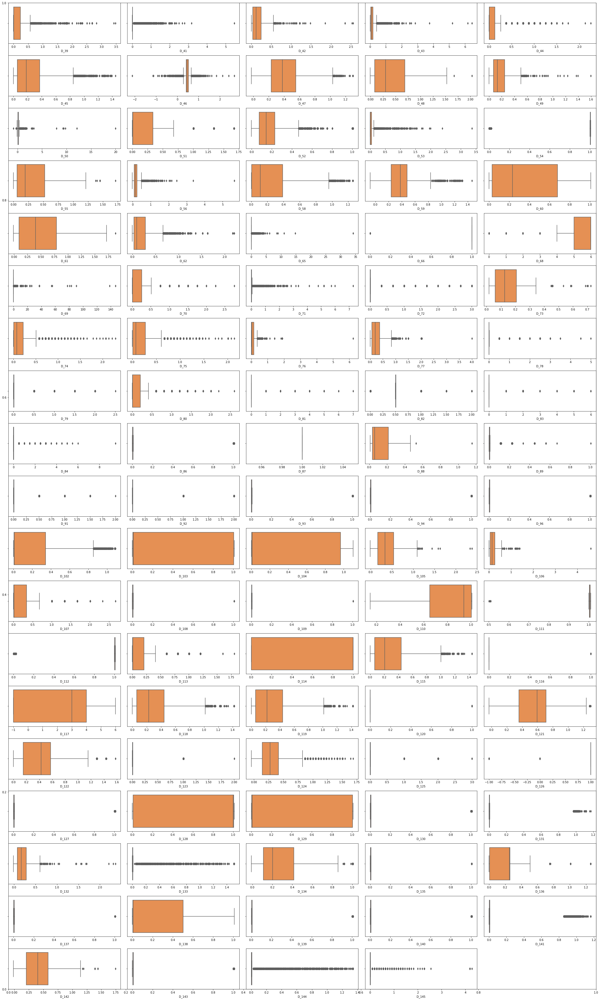

In [38]:
#plot outlier for D variables
nrows = 19
ncols = 5
fig, axes = plt.subplots(figsize=(30,50)) 
d_columns= ['D_39', 'D_41', 'D_42', 'D_43', 'D_44', 'D_45', 'D_46', 'D_47', 'D_48', 'D_49', 'D_50', 'D_51', 'D_52', 'D_53', 'D_54', 'D_55', 'D_56', 'D_58', 'D_59', 'D_60', 'D_61', 'D_62', 'D_65', 'D_66','D_68','D_69', 'D_70', 'D_71', 'D_72', 'D_73', 'D_74', 'D_75', 'D_76', 'D_77', 'D_78', 'D_79', 'D_80', 'D_81', 'D_82', 'D_83', 'D_84', 'D_86', 'D_87', 'D_88', 'D_89', 'D_91', 'D_92', 'D_93', 'D_94', 'D_96','D_102', 'D_103', 'D_104', 'D_105', 'D_106', 'D_107', 'D_108', 'D_109', 'D_110', 'D_111', 'D_112', 'D_113', 'D_114','D_115', 'D_116', 'D_117','D_118', 'D_119', 'D_120', 'D_121', 'D_122', 'D_123', 'D_124', 'D_125','D_126','D_127', 'D_128', 'D_129', 'D_130', 'D_131', 'D_132', 'D_133', 'D_134', 'D_135', 'D_136', 'D_137', 'D_138', 'D_139', 'D_140', 'D_141', 'D_142', 'D_143', 'D_144', 'D_145']
train_df_sample = train_df.sample(frac =.1)
for i, col in enumerate(d_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.boxplot(x=train_df_sample[col], ax=ax,palette="Oranges")
    
fig.tight_layout()  
plt.show()

**Observations:**

* Above box plot shows variability for D variables and outliers for the same

---
# S_* = Spend variables

---

---
**Summary of Dataframe for Spend variables**

---

In [39]:
#display summary of DataFrame for S variables
display(train_df[S_columns].info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 22 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   S_2     100000 non-null  object 
 1   S_3     81374 non-null   float64
 2   S_5     100000 non-null  float64
 3   S_6     100000 non-null  float64
 4   S_7     81374 non-null   float64
 5   S_8     100000 non-null  float64
 6   S_9     47266 non-null   float64
 7   S_11    100000 non-null  float64
 8   S_12    100000 non-null  float64
 9   S_13    100000 non-null  float64
 10  S_15    100000 non-null  float64
 11  S_16    100000 non-null  float64
 12  S_17    100000 non-null  float64
 13  S_18    100000 non-null  float64
 14  S_19    100000 non-null  float64
 15  S_20    100000 non-null  float64
 16  S_22    99672 non-null   float64
 17  S_23    99995 non-null   float64
 18  S_24    99677 non-null   float64
 19  S_25    99792 non-null   float64
 20  S_26    99979 non-null   float64
 21  S_27    746

None

**Observation:**

* S_2 is of dtype object with date value and rest are of dtype float64

---
**Descriptive statistics for Spend variables**

---

In [40]:
#display descriptive statistics for S variables
train_df[S_columns].describe().T.sort_values('count', ascending=False)

,count,mean,std,min,25%,50%,75%,max
S_16,100000.0,0.047434,0.719213,8.117018e-09,0.002533,0.005088,0.007651,67.963065
S_15,100000.0,0.374670,0.193497,-2.994731e-01,0.207623,0.401892,0.504802,3.304307
S_20,100000.0,0.015969,0.104209,9.865745e-08,0.002537,0.005054,0.007574,1.009990
S_19,100000.0,0.005011,0.003066,5.959079e-08,0.002481,0.004977,0.007493,0.128932
S_18,100000.0,0.031801,0.161556,2.311720e-07,0.002561,0.005120,0.007693,1.009996
S_17,100000.0,0.039623,0.241302,2.190073e-07,0.002682,0.005345,0.008049,4.049058
S_5,100000.0,0.085309,0.266274,6.721360e-07,0.005694,0.013885,0.071149,14.142183
S_13,100000.0,0.257605,0.298134,9.425451e-08,0.004889,0.009869,0.427943,1.009999
S_12,100000.0,0.240175,0.212789,-3.835411e-01,0.186910,0.190836,0.209408,16.746990
S_11,100000.0,0.378103,0.192936,-1.996115e-01,0.282618,0.289858,0.449832,3.801432


**Observation:**

* Following S variables(columns) around 4 of them appears to have higher missing values as per this sample dataset.

    * S_3, S_7, S_27, S_9
* There are S variables with outliers
* There are S variables with skewed distribution

---
**Q: What is the missing value plot for S Variable?**

---

<AxesSubplot:>

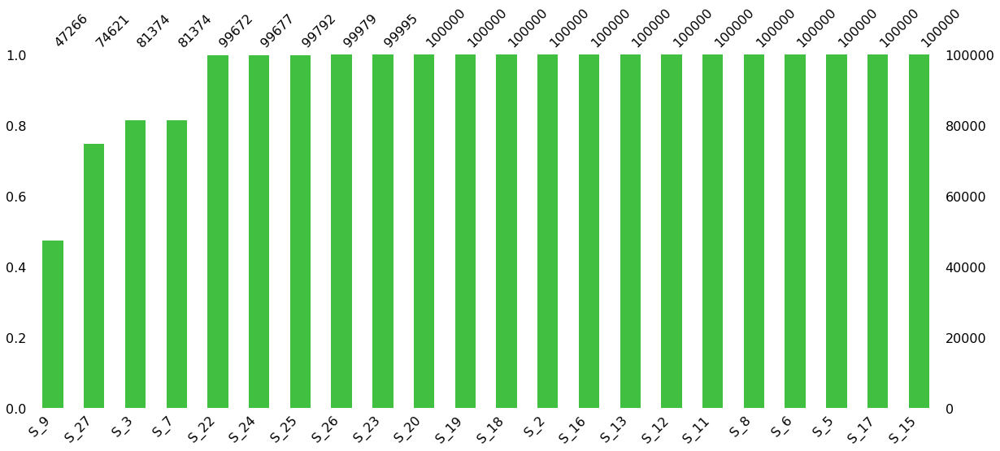

In [41]:
#plot of missing values for S variables
msno.bar(train_df[S_columns],figsize=(20,8), sort="ascending", color=(0.25,0.75,0.25))

**Observation:**

* Above plot shows S variables which are having missing value and which are not having missing value

    * e.g., S_9 or S_27 variable appears to have more missing value

---
**Q: What is the missing value relationship for S Variable?**

---

<AxesSubplot:>

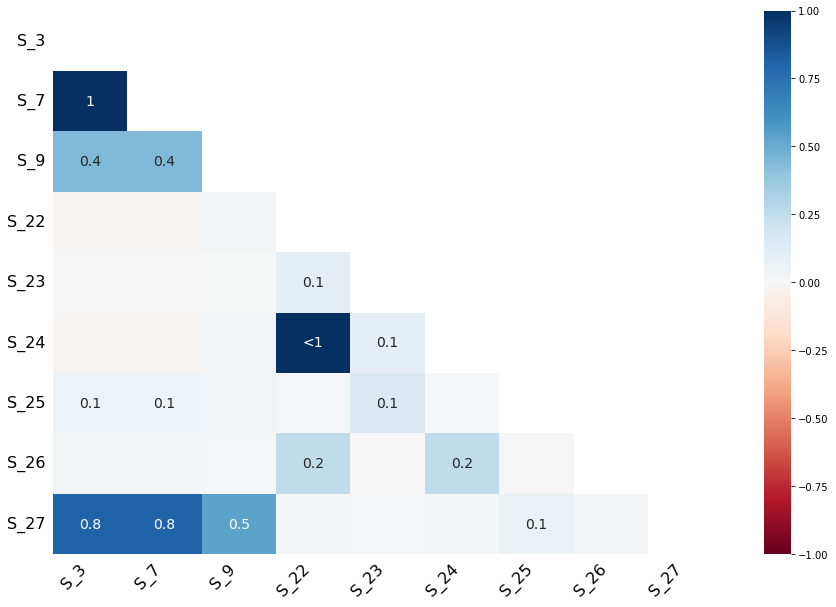

In [42]:
#plot of how missing values for S variables are related
msno.heatmap(train_df[S_columns],figsize=(15,10))

**Observation:**

* Above plot shows all the S variable which has missing value and also how they are related to other S variable for missing value.

    * e.g., missing value in S_3 variable is related to missing value in S_7 variable as they have relationship value of 1

---
**Q: What is the correlation for S Variable?**

---

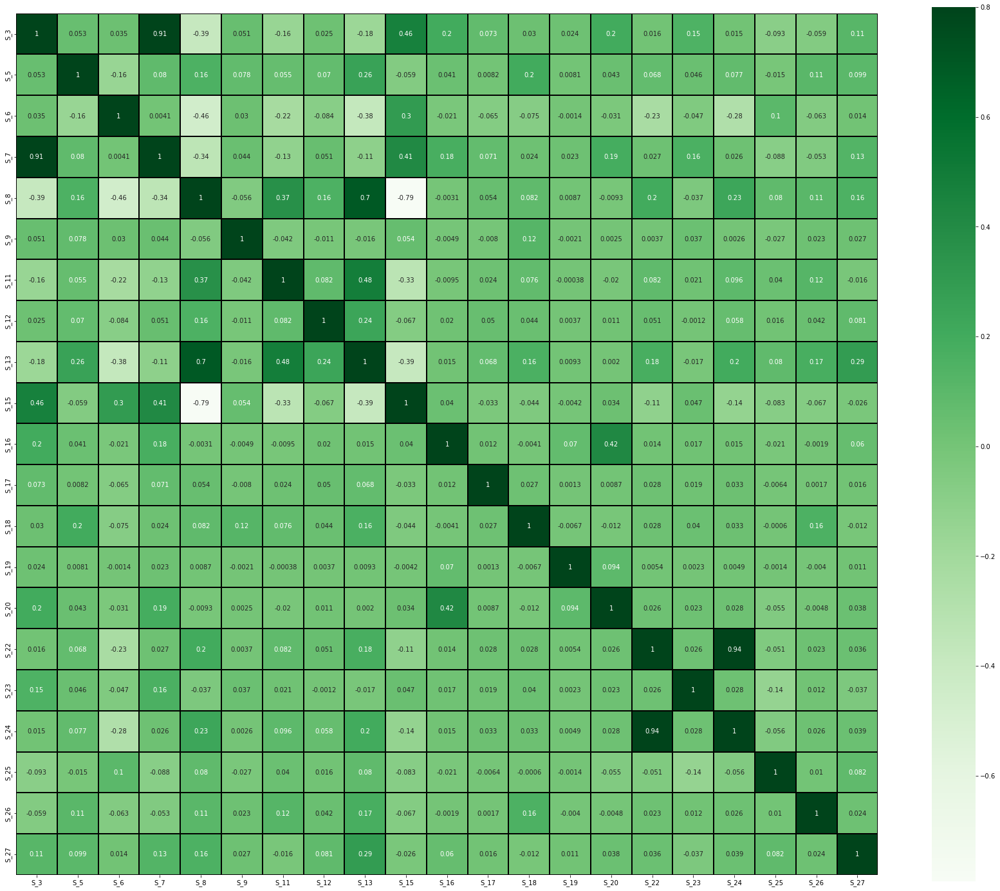

In [43]:
#plot correlation between S variables
corr = train_df[S_columns].corr(method='pearson')
plt.figure(figsize=(30,25))
# mask option can be used to not show values <=0.90
#sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='YlGnBu',linecolor ='black',mask = (np.abs(corr) <= 0.90))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Greens',linecolor ='black')
plt.show()

**Observation:**

* S_3 has correlation of 0.91 with S_7
* S_22 has correlation of 0.94 with S_24

---
**Q: What is the distribution for S Variable?**

---

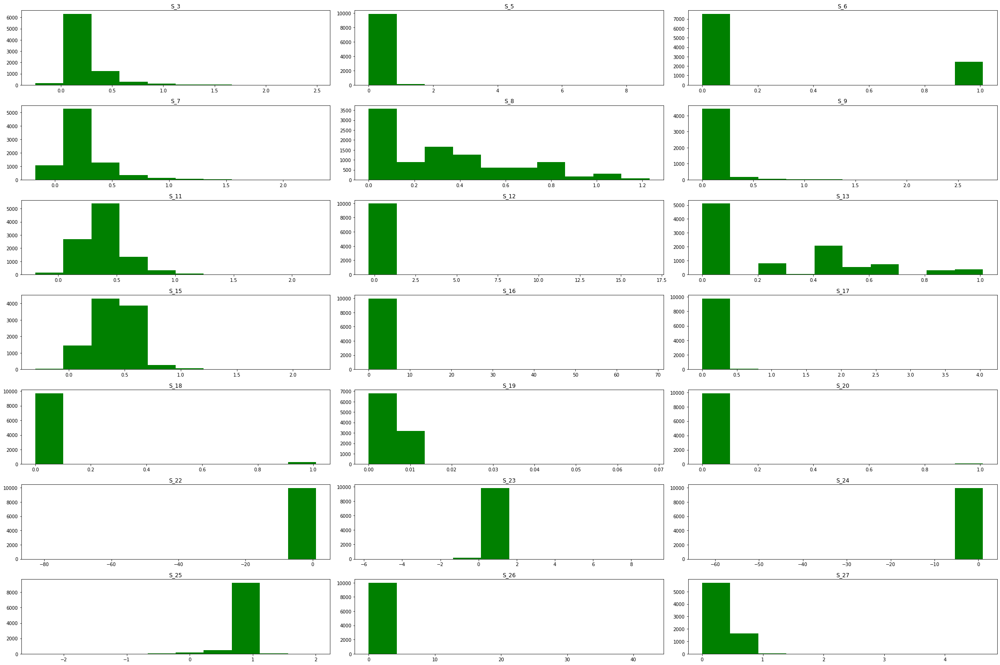

In [44]:
#plot distribution for S variables
fig, axes = plt.subplots(nrows = 7, ncols = 3, figsize=(30,20)) 
s_columns =['S_3', 'S_5', 'S_6', 'S_7', 'S_8', 'S_9', 'S_11', 'S_12', 'S_13', 'S_15', 'S_16', 'S_17', 'S_18', 'S_19', 'S_20', 'S_22', 'S_23', 'S_24', 'S_25', 'S_26', 'S_27']
axes = axes.flatten()   
#train_df_sample = train_df.sample(frac =.1)
for ax,col in zip(axes,s_columns):
    ax.hist(train_df_sample[col], color="g")
    ax.set_title(col)
    
plt.tight_layout()

**Observation:**

* Above plot shows distribution for S variables and skewness in distribution

    * There are many variables which appear to be having extreme end of value

---
**Q: What is the outlier value plot for S Variable?**

---

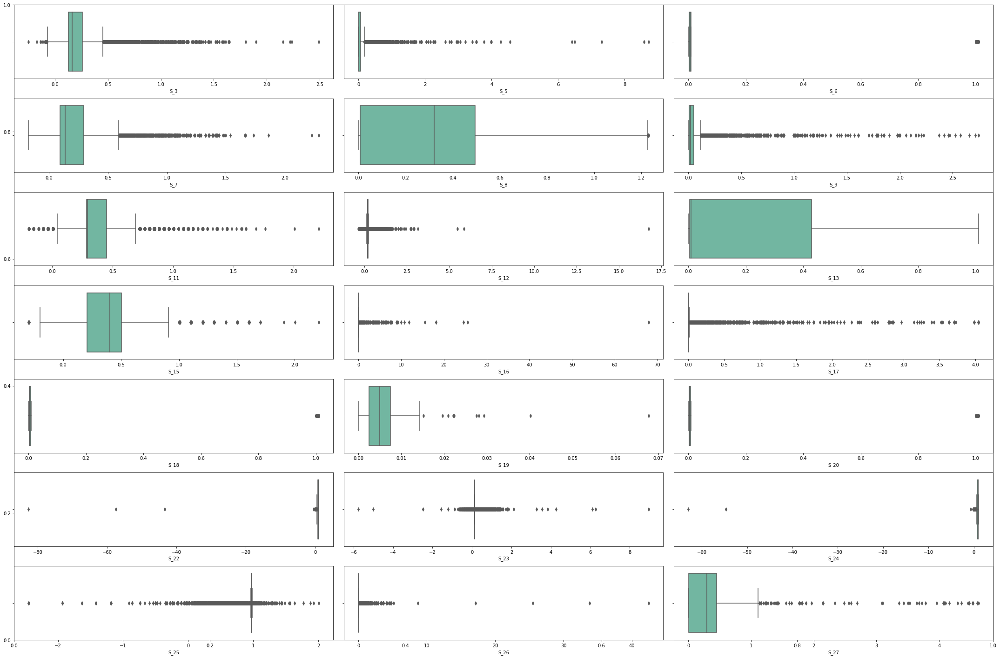

In [45]:
#plot outlier for S variables
nrows = 7
ncols = 3
fig, axes = plt.subplots(figsize=(30,20)) 
s_columns =['S_3', 'S_5', 'S_6', 'S_7', 'S_8', 'S_9', 'S_11', 'S_12', 'S_13', 'S_15', 'S_16', 'S_17', 'S_18', 'S_19', 'S_20', 'S_22', 'S_23', 'S_24', 'S_25', 'S_26', 'S_27']
#train_df_sample = train_df.sample(frac =.1)
for i, col in enumerate(s_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.boxplot(x=train_df_sample[col], ax=ax, palette="Set2")
    
fig.tight_layout()  
plt.show()

**Observations:**

* Above box plot shows variability for S variables and outliers for the same

---
# P_* = Payment variables

---

---
**Summary of Dataframe for Payment variables**

---

In [46]:
#display summary of DataFrame for P variables
display(train_df[P_columns].info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   P_2     99214 non-null   float64
 1   P_3     94589 non-null   float64
 2   P_4     100000 non-null  float64
dtypes: float64(3)
memory usage: 2.3 MB


None

**Observation:**

* All P variables are of dtype float64


---
**Descriptive statistics for Payment variables**

---

In [47]:
#display descriptive statistics for P variables
train_df[P_columns].describe().T.sort_values('count', ascending=False)

,count,mean,std,min,25%,50%,75%,max
P_4,100000.0,0.146917,0.341203,6.667930e-08,0.002933,0.005849,0.008802,1.198705
P_2,99214.0,0.653361,0.246656,-3.830190e-01,0.476155,0.692188,0.863579,1.009998
P_3,94589.0,0.600251,0.171806,-9.594399e-01,0.539598,0.618881,0.684364,1.826898


**Observation:**
* All P variable appears to have outliers
* P_2 variable appears to have slight skewed distribution
* P_3 variable appears to have normal distribution

---
**Q: What is the missing value plot for P Variable?**

---

<AxesSubplot:>

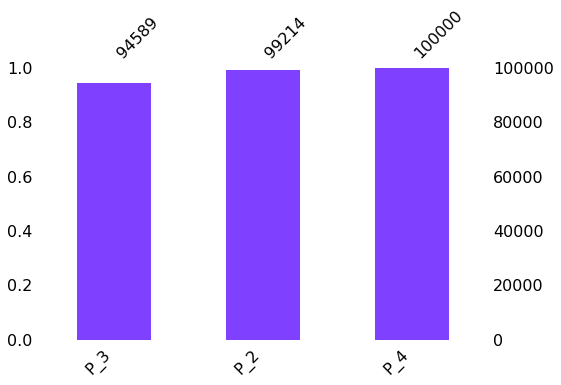

In [48]:
#plot of missing values for P variables
msno.bar(train_df[P_columns],figsize=(8,5), sort="ascending", color=(0.50,0.25,1.0))

**Observation:**

* Above plot shows P variables which are having missing value and which are not having missing value

    * e.g., P_3 or P_3 variable appears to have missing value

---
**Q: What is the missing value relationship for P Variable?**

---

<AxesSubplot:>

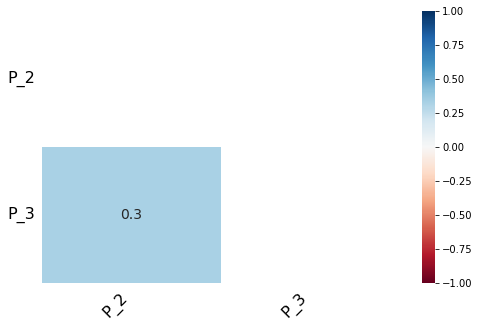

In [49]:
#plot of how missing values are related for P variables
msno.heatmap(train_df[P_columns],figsize=(8,5))

**Observation:**

* Above plot shows all the P variable which has missing value and also how they are related to other P variable for missing value.

    * There are only 2 variable in P out of 3 variable which has missing value and they are not related

---
**Q: What is the correlation for P Variable?**

---

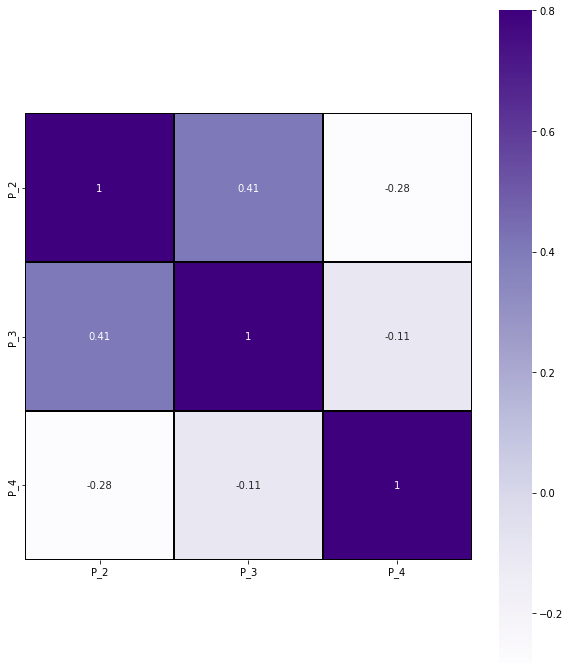

In [50]:
#plot correlation between P variables
corr = train_df[P_columns].corr(method='pearson')
plt.figure(figsize=(10,12))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Purples',linecolor ='black')
plt.show()

**Observation:**

* None of the P variables appears to be highly correlated.

---
**Q: What is the distribution for P Variable?**

---

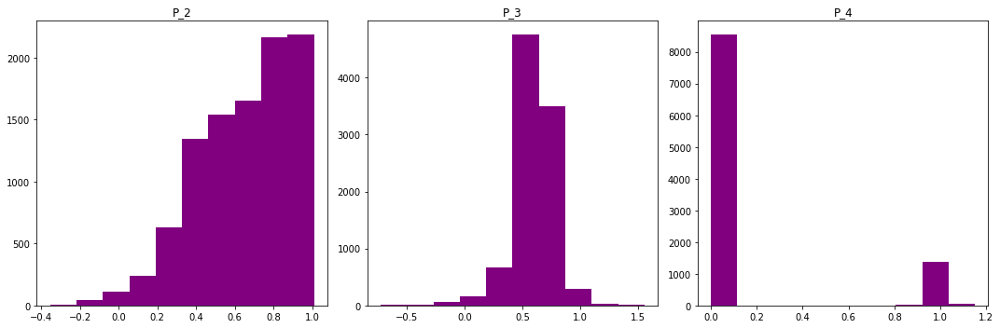

In [51]:
#plot distribution for P variables
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(15,5)) 
axes = axes.flatten()   
#train_df_sample = train_df.sample(frac =.1)
for ax,col in zip(axes,P_columns):
    ax.hist(train_df_sample[col], color="purple")
    ax.set_title(col)
    
plt.tight_layout()

**Observation:**

* P_2 variable appears to have skewed distribution
* P_3 variable appears to have normal distribution
* P_4 variable appears to have bimodal distribution

---
**Q: What is the outlier value plot for P Variable?**

---

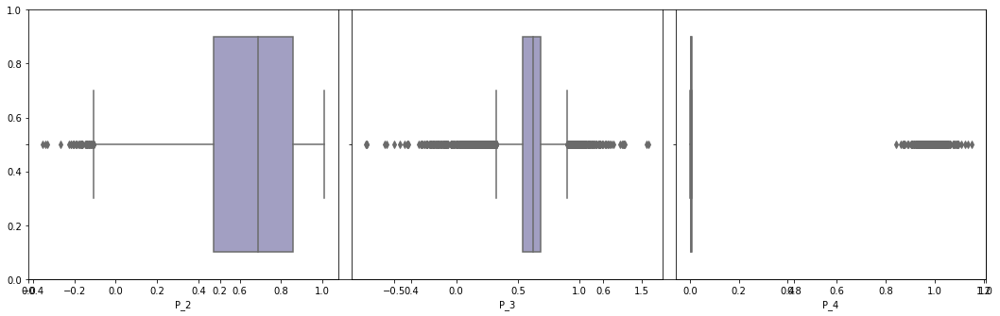

In [52]:
#plot outlier for P variables
nrows = 1
ncols = 3
fig, axes = plt.subplots(figsize=(15,5)) 
#train_df_sample = train_df.sample(frac =.1)
for i, col in enumerate(P_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.boxplot(x=train_df_sample[col], ax=ax,palette="Purples")
    
fig.tight_layout()  
plt.show()

**Observation:**

* Above box plot shows variability for P variables and outliers for the same

---
# B_* = Balance variables

---

---
**Summary of Dataframe for Balance variables**

---

In [53]:
#display summary of DataFrame for B variables
display(train_df[B_columns].info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 40 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   B_1     100000 non-null  float64
 1   B_2     99963 non-null   float64
 2   B_3     99963 non-null   float64
 3   B_4     100000 non-null  float64
 4   B_5     100000 non-null  float64
 5   B_6     99996 non-null   float64
 6   B_7     100000 non-null  float64
 7   B_8     99553 non-null   float64
 8   B_9     100000 non-null  float64
 9   B_10    100000 non-null  float64
 10  B_11    100000 non-null  float64
 11  B_12    100000 non-null  float64
 12  B_13    99098 non-null   float64
 13  B_14    100000 non-null  float64
 14  B_15    99880 non-null   float64
 15  B_16    99963 non-null   float64
 16  B_17    43809 non-null   float64
 17  B_18    100000 non-null  float64
 18  B_19    99963 non-null   float64
 19  B_20    99963 non-null   float64
 20  B_21    100000 non-null  float64
 21  B_22    999

None

**Observation:**

* B_31 is of dtype int64, B_30 and B_38 as dtype float64 even though they both have categorical type value and rest are of dtype float64

---
**Descriptive statistics for Balance variables**

---

In [54]:
#display descriptive statistics for B variables
train_df[B_columns].describe(include='all').T.sort_values('count', ascending=False)

,count,mean,std,min,25%,50%,75%,max
B_1,100000.0,0.126169,0.215040,-2.951260e-01,0.008944,0.032475,0.129060,1.324053
B_14,100000.0,0.105047,0.268889,-2.421581e+00,0.008266,0.029427,0.102616,14.166471
B_40,100000.0,0.180706,0.502561,1.875728e-08,0.017693,0.059900,0.250338,36.801696
B_37,100000.0,0.125257,0.214759,-1.344169e+00,0.008924,0.032181,0.126954,1.327770
B_36,100000.0,0.006763,0.024827,7.328090e-08,0.002526,0.005023,0.007552,0.526128
B_32,100000.0,0.029779,0.155519,1.420629e-08,0.002544,0.005115,0.007680,1.009996
B_31,100000.0,0.997130,0.053496,0.000000e+00,1.000000,1.000000,1.000000,1.000000
B_28,100000.0,0.158751,0.226921,1.549838e-05,0.028109,0.079100,0.199351,6.630456
B_24,100000.0,0.040163,0.329543,5.912608e-08,0.002582,0.005201,0.007797,40.808852
B_23,100000.0,0.173847,0.230828,2.385407e-06,0.017846,0.060612,0.250376,1.385104


**Observation:**

* Following B variables(columns) around 4 of them appears to have significant amount of missing values as per this sample dataset.

    * B_17, B_29, B_42, B_39
* There are B variables with outliers
* There are B variables with skewed distribution

---
**Q: What is the missing value plot for B Variable?**

---

<AxesSubplot:>

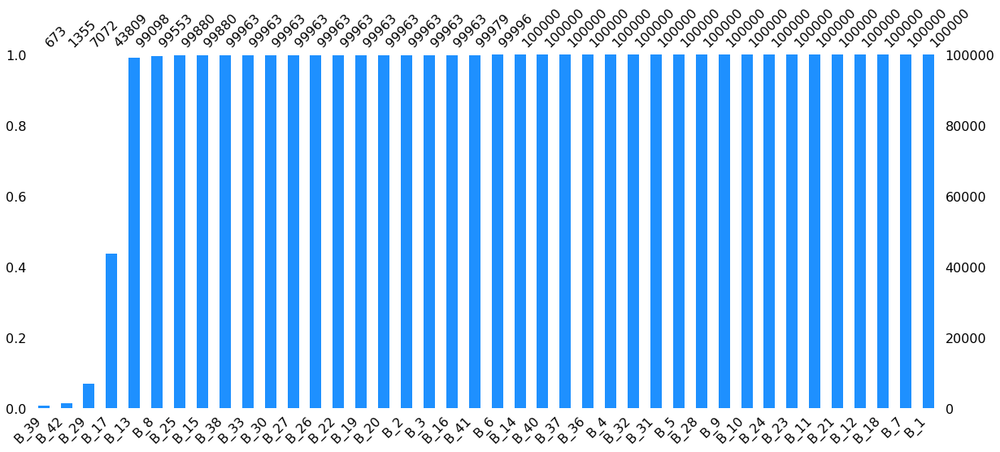

In [55]:
#plot of missing values for B variables
msno.bar(train_df[B_columns],figsize=(20,8), sort="ascending", color="dodgerblue")

**Observation:**

* Above plot shows B variables which are having missing value and which are not having missing value

    * e.g., B_39, B_42 or B_29 variable appears to have significant amount of missing value

---
**Q: What is the missing value relationship for B Variable?**

---

<AxesSubplot:>

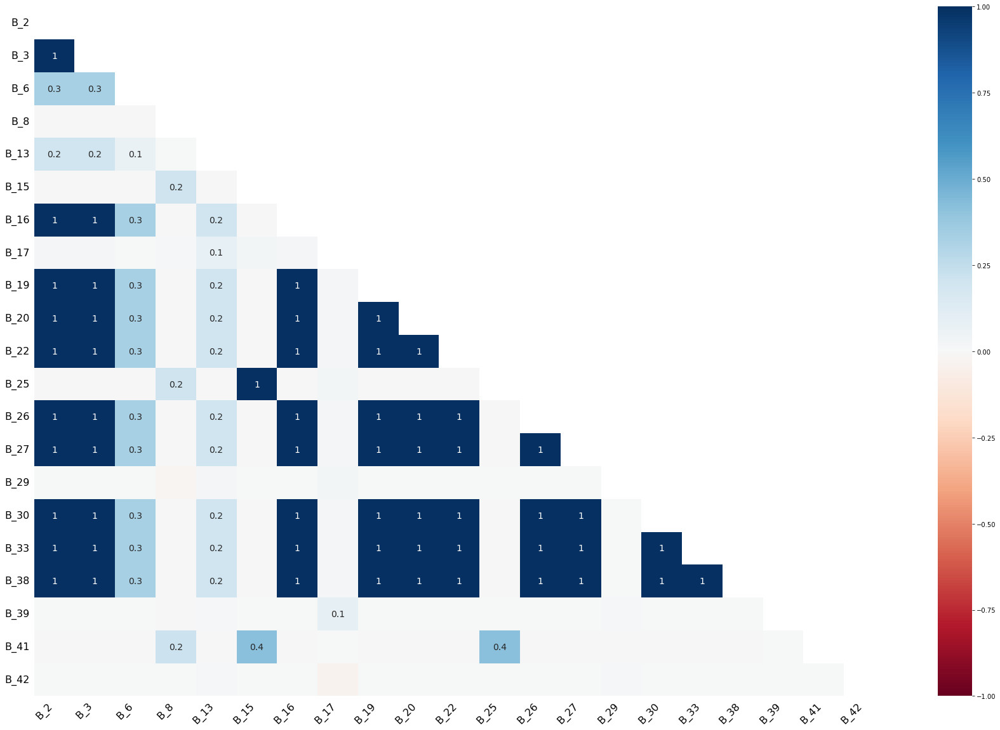

In [56]:
#plot of how missing values are related for B variables
msno.heatmap(train_df[B_columns],figsize=(30,20))

**Observation:**

* Above plot shows all the B variable which has missing value and also how they are related to other B variable for missing value.

    * e.g., missing value in B_15 variable is related to missing value in B_25 variable as they have relationship value of 1

---
**Q: What is the correlation for B Variable?**

---

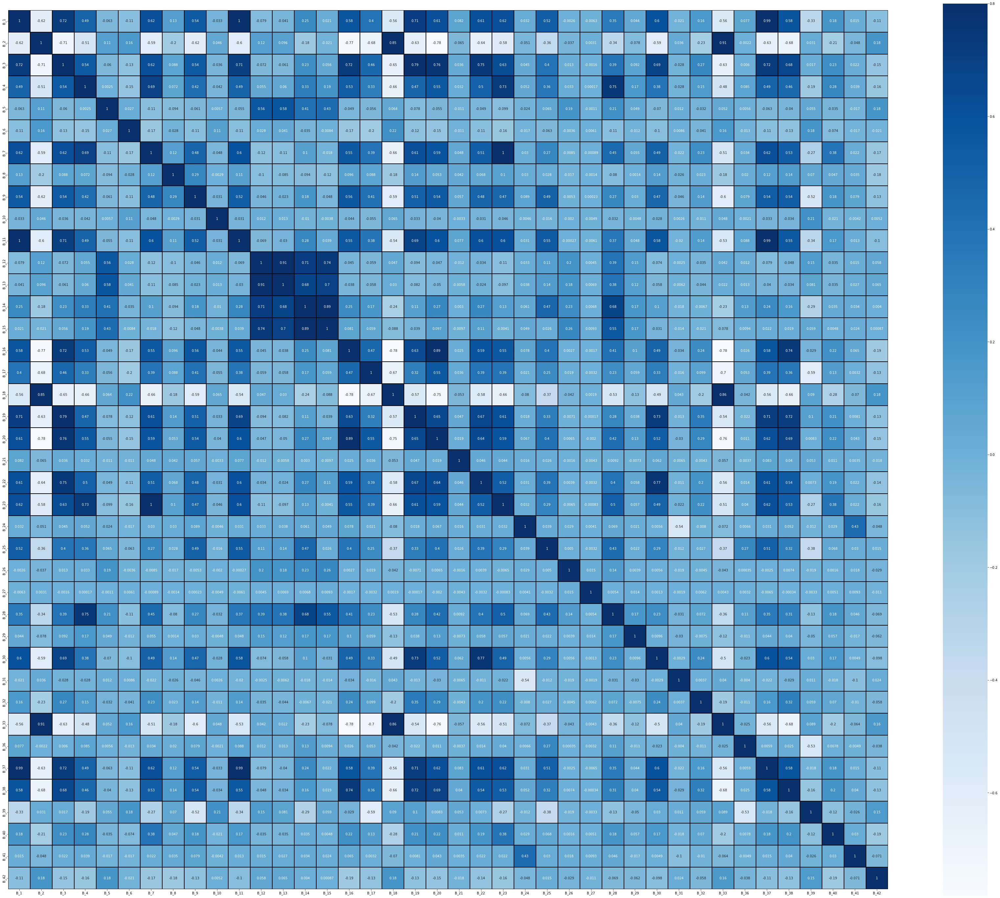

In [57]:
#plot correlation between B variables
corr = train_df[B_columns].corr(method='pearson')
plt.figure(figsize=(60,50))
# mask option can be used to not show values <=0.90
#sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Blues',linecolor ='black',mask = (np.abs(corr) <= 0.90))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Blues',linecolor ='black')
plt.show()

**Observation:**

* B_1 has correlation of 0.99 with B_37
* B_1 has correlation of 1.0 with B_11
* B_2 has correlation of 0.91 with B_33
* B_2 has correlation of 0.85 with B_18
* B_11 has correlation of 0.99 with B_37
* B_12 has correlation of 0.91 with B_13
* B_14 has correlation of 0.89 with B_15
* B_7 has correlation of 1.0 with B_23

---
**Q: What is the distribution for B Variable?**

---

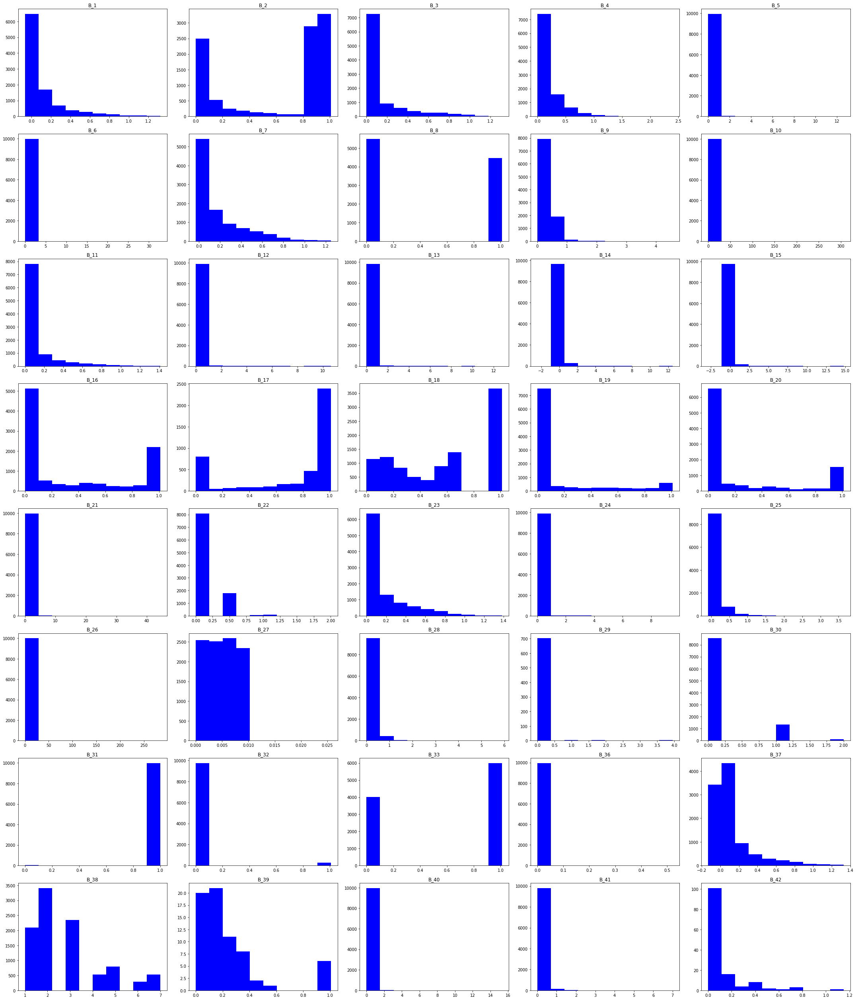

In [58]:
#plot distribution for B variables
fig, axes = plt.subplots(nrows = 8, ncols = 5, figsize=(30,35)) 
axes = axes.flatten()   
#train_df_sample = train_df.sample(frac =.1)
for ax,col in zip(axes,B_columns):
    ax.hist(train_df_sample[col],color="b")
    ax.set_title(col)
    
plt.tight_layout()

**Observation:**

* Above plot shows distribution for B variables and skewness in distribution

    * There are many variables which appear to be having extreme end of value

---
**Q: What is the outlier value plot for B Variable?**

---

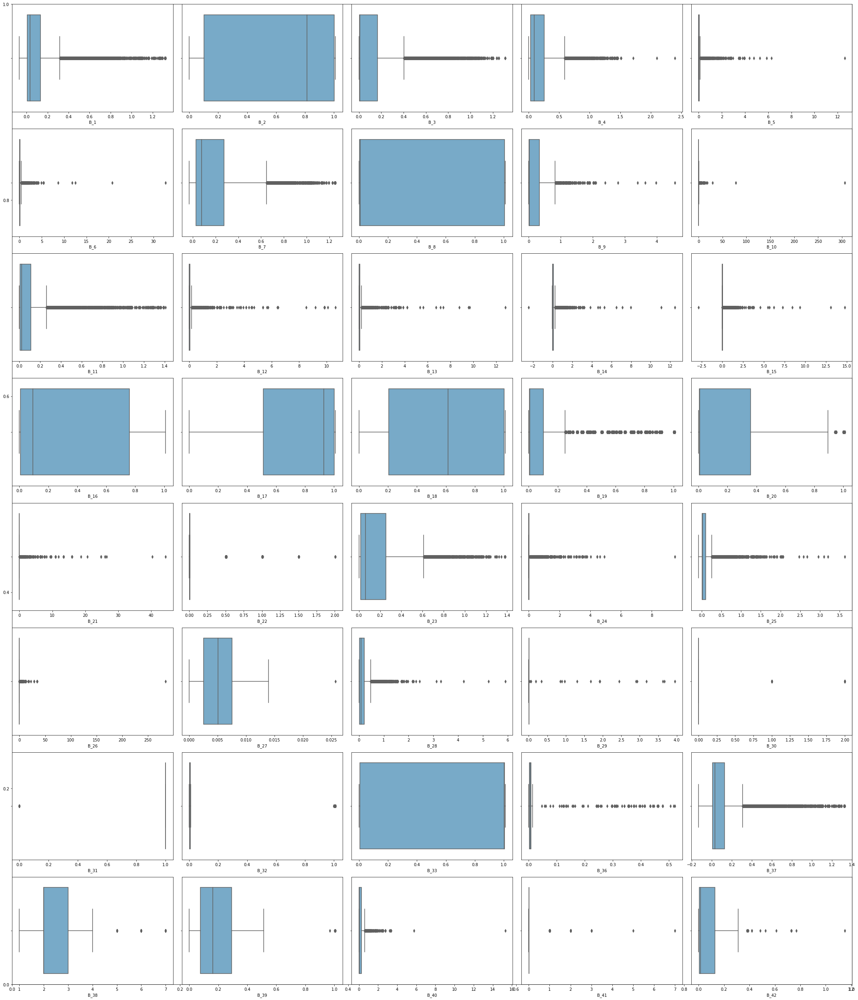

In [59]:
#plot outlier for B variables
nrows = 8
ncols = 5
fig, axes = plt.subplots(figsize=(30,35)) 
#train_df_sample = train_df.sample(frac =.1)
for i, col in enumerate(B_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.boxplot(x=train_df_sample[col], ax=ax, palette="Blues")
    
fig.tight_layout()  
plt.show()

**Observation:**

* Above box plot shows variability for B variables and outliers for the same

---
# R_* = Risk variables

---

---
**Summary of Dataframe for Risk variables**

---

In [60]:
#display summary of DataFrame for R variables
display(train_df[R_columns].info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   R_1     100000 non-null  float64
 1   R_2     100000 non-null  float64
 2   R_3     100000 non-null  float64
 3   R_4     100000 non-null  float64
 4   R_5     100000 non-null  float64
 5   R_6     100000 non-null  float64
 6   R_7     100000 non-null  float64
 7   R_8     100000 non-null  float64
 8   R_9     5793 non-null    float64
 9   R_10    100000 non-null  float64
 10  R_11    100000 non-null  float64
 11  R_12    100000 non-null  float64
 12  R_13    100000 non-null  float64
 13  R_14    100000 non-null  float64
 14  R_15    100000 non-null  float64
 15  R_16    100000 non-null  float64
 16  R_17    100000 non-null  float64
 17  R_18    100000 non-null  float64
 18  R_19    100000 non-null  float64
 19  R_20    99995 non-null   float64
 20  R_21    100000 non-null  float64
 21  R_22    100

None

**Observation:**

* All R variable are of dtype float64
* R_9 variable seems to be almost empty


---
**Descriptive statistics for Risk variables**

---

In [61]:
#display descriptive statistics for R variables
train_df[R_columns].describe().T.sort_values('count', ascending=False)

,count,mean,std,min,25%,50%,75%,max
R_1,100000.0,0.080968,0.231042,2.970408e-08,0.002886,0.005788,0.008670,2.507711
R_14,100000.0,0.184306,6.026997,2.750279e-07,0.002522,0.005057,0.007605,924.900177
R_25,100000.0,0.008488,0.058868,2.508709e-07,0.002536,0.005034,0.007546,1.009953
R_24,100000.0,0.019257,0.118595,5.101269e-08,0.002546,0.005065,0.007597,1.009995
R_23,100000.0,0.005472,0.021877,1.194953e-07,0.002487,0.005005,0.007516,1.009402
R_22,100000.0,0.009202,0.064809,1.270006e-07,0.002515,0.005022,0.007508,1.009955
R_21,100000.0,0.020252,0.122585,9.306526e-08,0.002535,0.005077,0.007628,1.009989
R_19,100000.0,0.023165,0.133612,1.065848e-07,0.002524,0.005091,0.007642,1.009997
R_18,100000.0,0.005005,0.003109,1.466375e-07,0.002513,0.004988,0.007500,0.263310
R_17,100000.0,0.005345,0.006262,1.205504e-08,0.002518,0.005048,0.007539,0.380176


**Observation:**

* Following R variables(columns) around 2 of them appears to have significant amount of missing values as per this sample dataset.

    * R_26, R_9
    
* There are R variables with outliers
* There are R variables with skewed distribution

---
**Q: What is the missing value plot for R Variable?**

---

<AxesSubplot:>

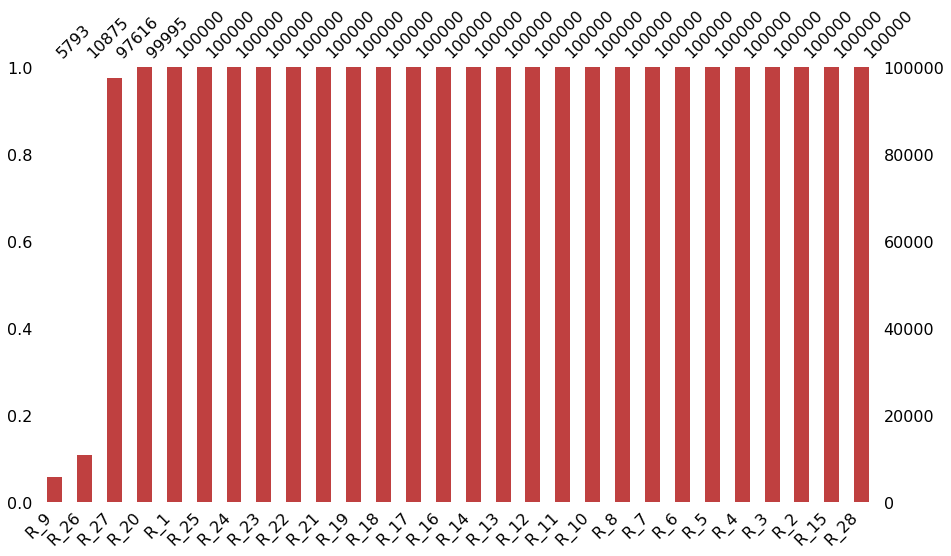

In [62]:
#plot of missing values for R variables
msno.bar(train_df[R_columns],figsize=(15,8),sort="ascending", color=(0.75, 0.25, 0.25))

**Observation:**

* Above plot shows R variables which are having missing value and which are not having missing value

    * e.g., R_9 or R_26 variable appears to have quite a lot of missing value

---
**Q: What is the missing value relationship for R Variable?**

---

<AxesSubplot:>

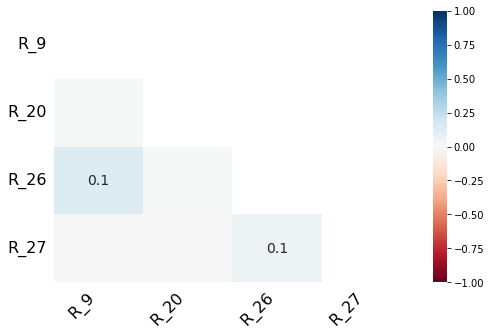

In [63]:
#plot of how missing values are related for R variables
msno.heatmap(train_df[R_columns],figsize=(8,5))

**Observation:**

* Above plot shows all the R variable which has missing value and also how they are related to other R variable for missing value.

    * * There are only 4 variable in R variable which has missing value and they are not related

---
**Q: What is the correlation for R Variable?**

---

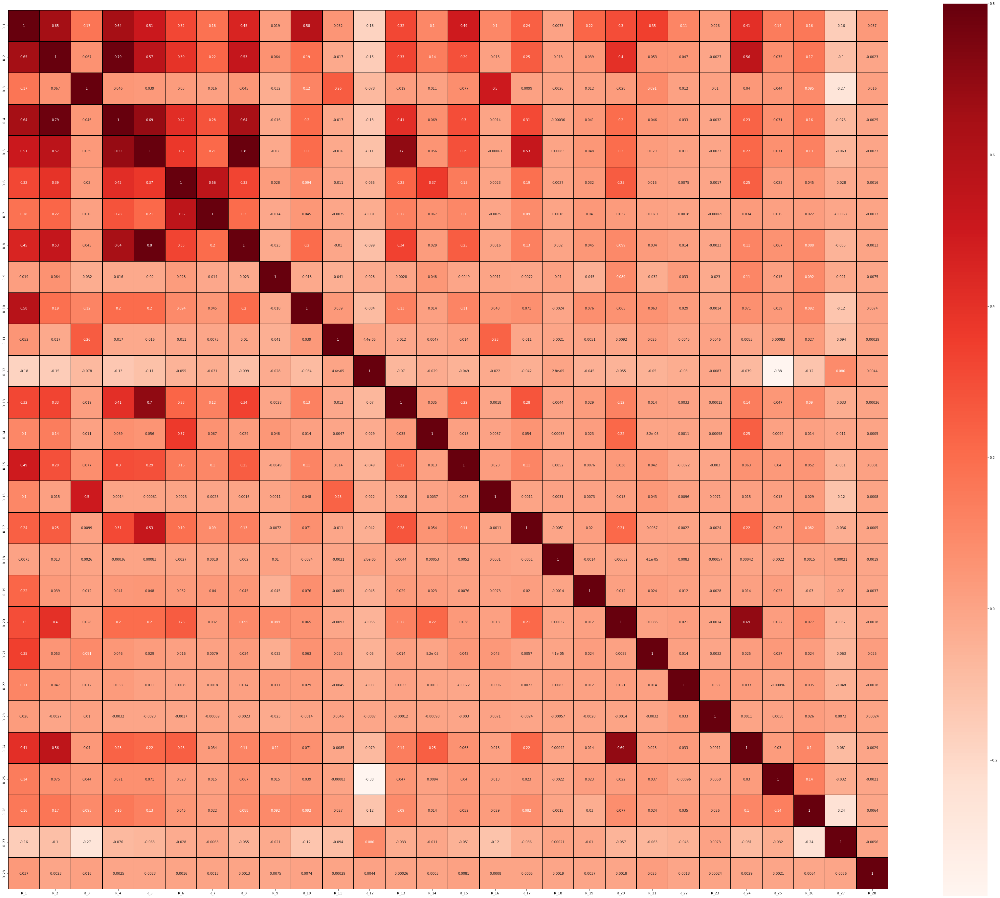

In [64]:
#plot correlation between R variables
corr = train_df[R_columns].corr(method='pearson')
plt.figure(figsize=(60,50))
# mask option can be used to not show values <=0.90
#sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Reds',linecolor ='black',mask = (np.abs(corr) <= 0.90))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Reds',linecolor ='black')
plt.show()

**Observation:**

* R_4 has correlation of 0.79 with R_2
* R_5 has correlation of 0.8 with R_8

---
**Q: What is the distribution for R Variable?**

---

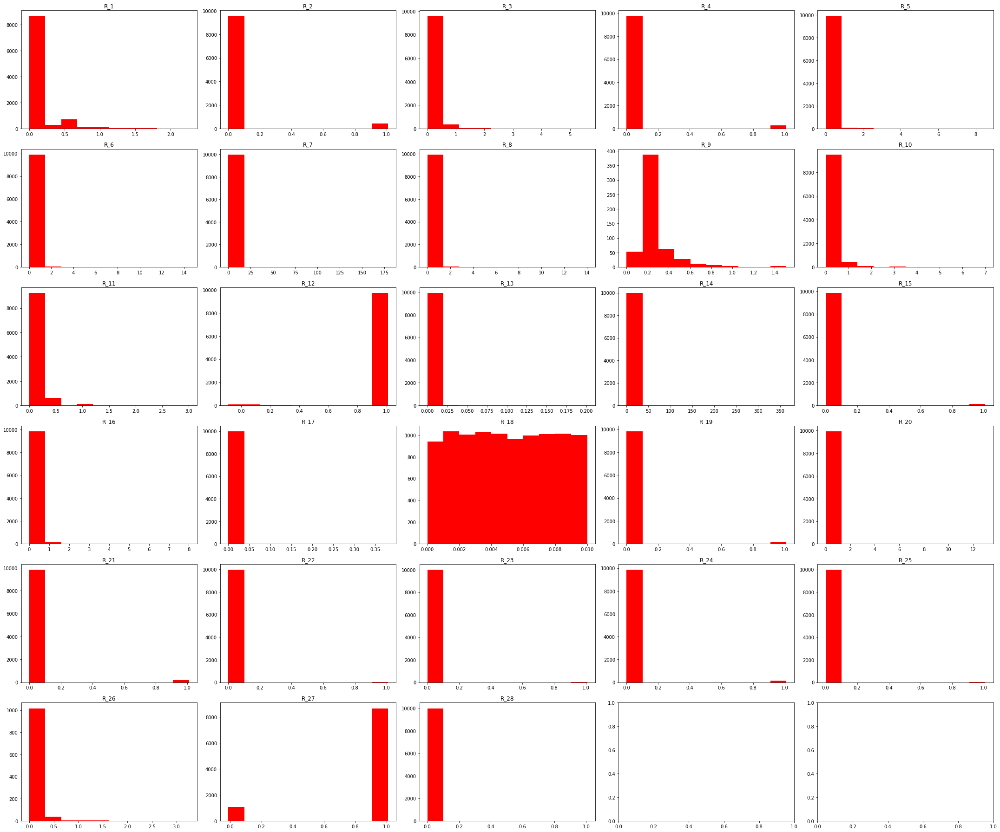

In [65]:
#plot distribution for R variables
fig, axes = plt.subplots(nrows = 6, ncols = 5, figsize=(30,25)) 
axes = axes.flatten()   
#train_df_sample = train_df.sample(frac =.1)
for ax,col in zip(axes,R_columns):
    ax.hist(train_df_sample[col], color="r")
    ax.set_title(col)
    
plt.tight_layout()

**Observation:**

* Above plot shows distribution for R variables and skewness in distribution

    * There are many variables which appear to be having extreme form of value

---
**Q: What is the outlier value plot for R Variable?**

---

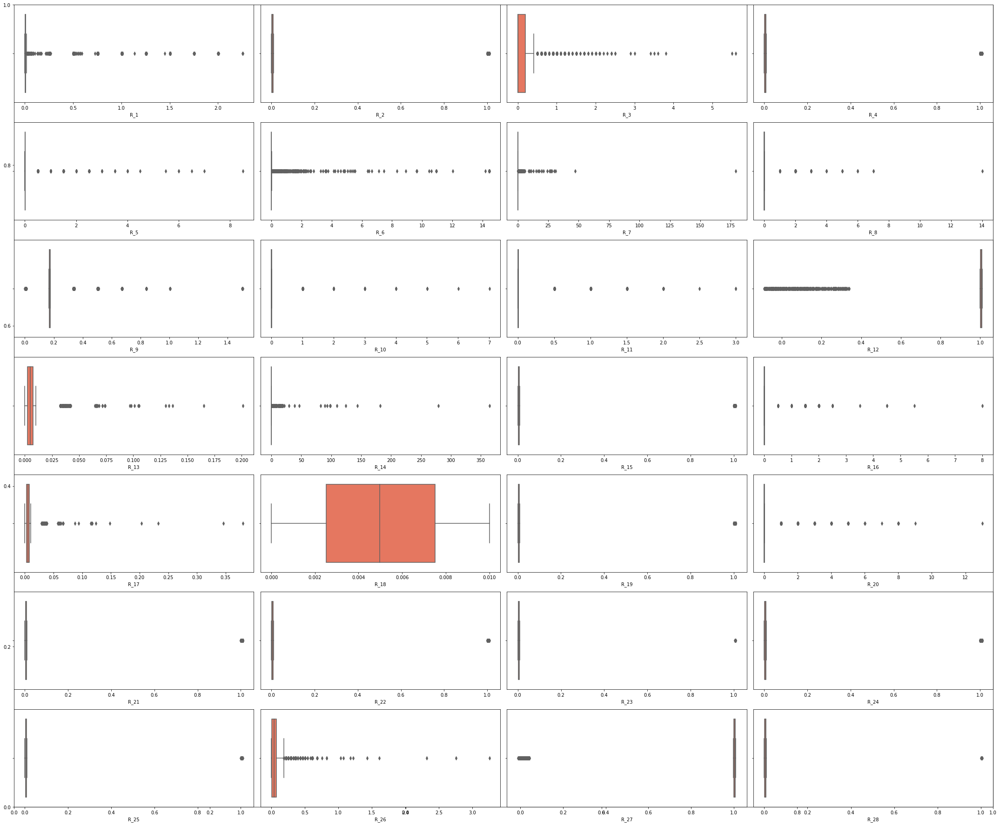

In [66]:
#plot outlier for R variables
nrows = 7
ncols = 4
fig, axes = plt.subplots(figsize=(30,25)) 
#train_df_sample = train_df.sample(frac =.1)
for i, col in enumerate(R_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.boxplot(x=train_df_sample[col], ax=ax, palette="Reds")
    
fig.tight_layout()  
plt.show()

**Observation:**

* Above box plot shows variability for R variables and outliers for the same

In [67]:
del train_df_sample

---
# Categorical variables

---

Following are categorical variables:

**['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']**

---
**Summary of Dataframe for Categorical variables**

---

In [68]:
# display dataframe summary for categorical variables (columns)
train_df[['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 11 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   B_30    99963 non-null   float64
 1   B_38    99963 non-null   float64
 2   D_114   96784 non-null   float64
 3   D_116   96784 non-null   float64
 4   D_117   96784 non-null   float64
 5   D_120   96784 non-null   float64
 6   D_126   97869 non-null   float64
 7   D_63    100000 non-null  object 
 8   D_64    95920 non-null   object 
 9   D_66    11077 non-null   float64
 10  D_68    96012 non-null   float64
dtypes: float64(9), object(2)
memory usage: 8.4+ MB


Converting B categorical variable dtype from float64 to object

In [69]:
#convert dtype for B categorical variable to object
train_df = train_df.astype({"B_30": 'str', "B_38": 'str'})

Converting D categorical variable dtype from float64 to object

In [70]:
#convert dtype for D categorical variable to object
train_df = train_df.astype({"D_114": 'str', "D_116": 'str', "D_117": 'str', "D_120": 'str', "D_126": 'str', "D_66": 'str', "D_68": 'str'})

---
**Summary of Dataframe for Categorical variables**

---

In [71]:
# display dataframe summary for categorical variables (columns)
train_df[['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 11 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   B_30    100000 non-null  object
 1   B_38    100000 non-null  object
 2   D_114   100000 non-null  object
 3   D_116   100000 non-null  object
 4   D_117   100000 non-null  object
 5   D_120   100000 non-null  object
 6   D_126   100000 non-null  object
 7   D_63    100000 non-null  object
 8   D_64    95920 non-null   object
 9   D_66    100000 non-null  object
 10  D_68    100000 non-null  object
dtypes: object(11)
memory usage: 8.4+ MB


---
**Q: What does data look like for Categorical variables?**

---

In [72]:
# display sample data for categorical variables (columns)
train_df[['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']]

,B_30,B_38,D_114,D_116,D_117,D_120,D_126,D_63,D_64,D_66,D_68
0,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,nan,6.0
1,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,nan,6.0
2,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,nan,6.0
3,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,nan,6.0
4,0.0,2.0,1.0,0.0,4.0,0.0,1.0,CR,O,nan,6.0
...,...,...,...,...,...,...,...,...,...,...,...
99995,1.0,7.0,0.0,0.0,4.0,0.0,1.0,CO,U,nan,3.0
99996,1.0,6.0,0.0,0.0,4.0,0.0,1.0,CO,U,nan,3.0
99997,1.0,6.0,0.0,0.0,4.0,0.0,1.0,CO,U,nan,3.0
99998,0.0,1.0,0.0,0.0,-1.0,0.0,0.0,CO,U,nan,5.0


---
**Descriptive statistics for Categorical variables**

---

In [73]:
#display descriptive statistics for categorical variables
train_df[['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']].describe(include='all')

,B_30,B_38,D_114,D_116,D_117,D_120,D_126,D_63,D_64,D_66,D_68
count,100000,100000,100000,100000,100000,100000,100000,100000,95920,100000,100000
unique,4,8,3,3,8,3,4,6,4,3,8
top,0.0,2.0,1.0,0.0,-1.0,0.0,1.0,CO,O,nan,6.0
freq,85010,34509,60601,96656,26075,85142,76960,73774,53302,88923,50136


**Observation:**

* B_30 variable appears to have 4 unique categories with "0.0" having highest frequency of occurrence
* B_38 variable appears to have 8 unique categories with "2.0" having highest frequency of occurence
* D_114 variable appears to have 3 unique categories with "1.0" having highest frequency of occurence
* D_114 variable appears to have 3 unique categories with "1.0" having highest frequency of occurence
* D_116 variable appears to have 3 unique categories with "0.0" having highest frequency of occurence
* D_117 variable appears to have 8 unique categories with "-1.0" having highest frequency of occurence
* D_120 variable appears to have 3 unique categories with "0.0" having highest frequency of occurence
* D_126 variable appears to have 4 unique categories with "1.0" having highest frequency of occurence
* D_63 variable has 6 unique categories with "CO" having highest frequency of occurrence
* D_64 variable has 4 unique categories with "O" having highest frequency of occurrence
* D_66 variable appears to have significant amount of missing values in this sample dataset
* D_68 variable appears to have 8 unique categories with "6.0" having highest frequency of occurence

---
**Q: What is the distribution for Categorical Variable?**

---

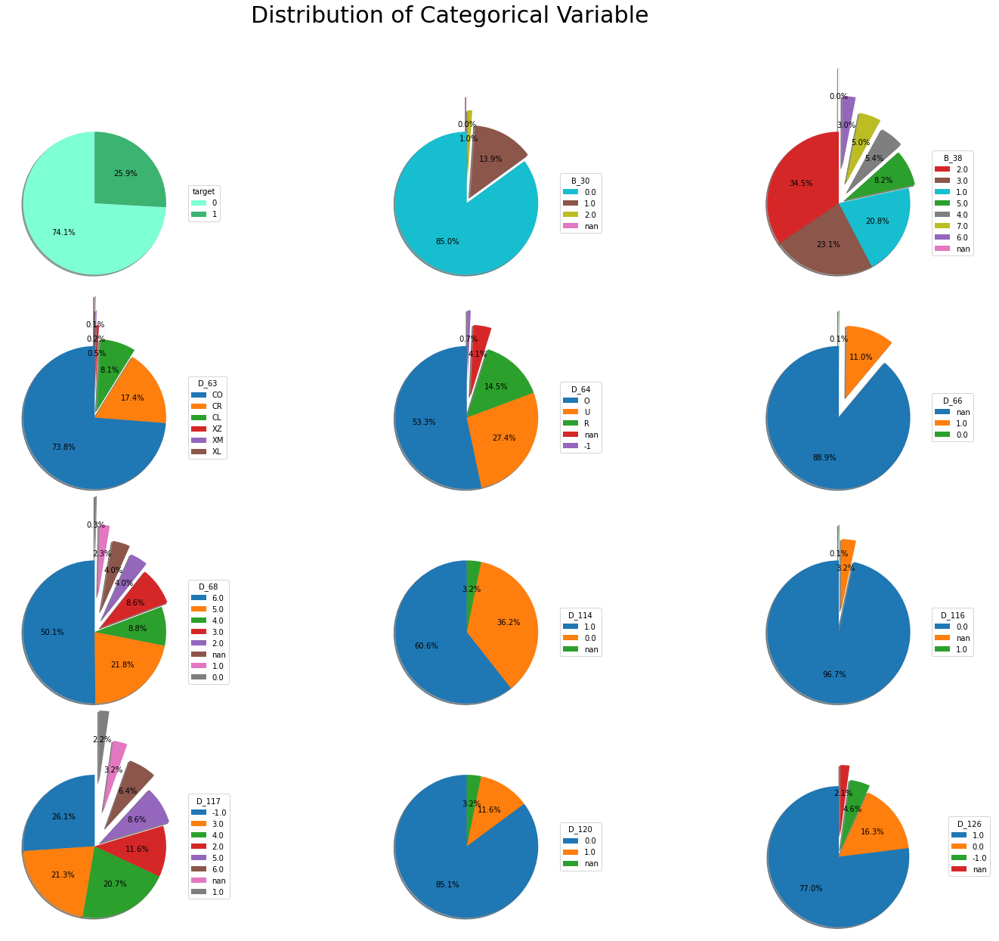

In [74]:
# plot distribution of categorical variables
fig,((ax1,ax2,ax3),(ax4,ax5,ax6),(ax7,ax8,ax9),(ax10,ax11,ax12)) = plt.subplots(4,3,figsize=(25,20))
fig.suptitle('Distribution of Categorical Variable',fontsize=30)

ax1.pie(train_label_df['target'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90, colors={'aquamarine','mediumseagreen'})
ax1.legend(labels = train_label_df['target'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='target',frameon = True)

ax2.pie(train_df['B_30'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.1,0.3,0.5), colors={'tab:cyan','tab:olive','tab:pink','tab:brown'})
ax2.legend(labels = train_df['B_30'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='B_30',frameon = True)

ax3.pie(train_df['B_38'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.0,0.0,0.1,0.2,0.3,0.5,0.9),colors={'tab:cyan','tab:olive','tab:pink','tab:brown','tab:gray','tab:purple','tab:red','tab:green'})
ax3.legend(labels = train_df['B_38'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='B_38',frameon = True)

ax4.pie(train_df['D_63'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90, explode=(0.0,0.0,0.1,0.3,0.5,0.7))
ax4.legend(labels = train_df['D_63'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5),title ='D_63',frameon = True)

ax5.pie(train_df['D_64'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.0,0.0,0.3,0.5))
ax5.legend(labels = train_df['D_64'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_64',frameon = True)

ax6.pie(train_df['D_66'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.3,0.5))
ax6.legend(labels = train_df['D_66'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_66',frameon = True)

ax7.pie(train_df['D_68'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.0,0.0,0.1,0.2,0.3,0.5,0.9))
ax7.legend(labels = train_df['D_68'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_68',frameon = True)

ax8.pie(train_df['D_114'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90)
ax8.legend(labels = train_df['D_114'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_114',frameon = True)

ax9.pie(train_df['D_116'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.3,0.5))
ax9.legend(labels = train_df['D_116'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_116',frameon = True)

ax10.pie(train_df['D_117'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.0,0.0,0.0,0.1,0.3,0.5,0.9))
ax10.legend(labels = train_df['D_117'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_117',frameon = True)

ax11.pie(train_df['D_120'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90)
ax11.legend(labels = train_df['D_120'].value_counts(dropna=False).index, loc ='center left', bbox_to_anchor=(1, 0.5), title ='D_120',frameon = True)

ax12.pie(train_df['D_126'].value_counts(dropna=False), autopct='%1.1f%%',shadow=True, startangle=90,explode=(0.0,0.0,0.1,0.3))
ax12.legend(labels = train_df['D_126'].value_counts(dropna=False).index, loc ='center right', title ='D_126',frameon = True)

plt.axis('equal')
fig.show()

**Observation:**

* target variable has 74.1% as target=0(Not Default) and 25.9% as target=1(Default)
* B_30 variable has 85.0% of value as "0.0" value
* B_38 variable has 34.5% of value as "2.0", 23.1% of value as "3.0" and 20.8% of value as "1.0"
* D_63 variable has 73.8% of value as "CO", 17.4% of value as "CR" and 8.1% of value as "CL"
* D_64 variable has 53.3% of value as "O", 27.4% of value as "U" and 14.5% of value as "R"
* D_66 variable has 88.9% of value as nan
* D_68 variable has 50.1% of value as "6.0", 21.8% of value as "5.0", 8.8% of value as "4.0" and 8.6% of value as "3.0"
* D_114 variable has 60.6% of value as "1.0" and 36.2% of value as "0.0"
* D_116 variable has 96.7% of value as "0.0"
* D_117 variable has 26.1% of value as "-1.0", 21.3% of value as "3.0",20.7% of value as "4.0" and 11.6% of value as "2.0"
* D_120 variable has 85.1% of value as "0.0" value and 11.6% of value as "1.0"
* D_126 variable has 77.0% of value as "1.0" value and 16.% of value as "0.0"

In [75]:
del test_df
del sample_submission_df

---
# Data Insights/Trends

---

* Deliquency in general means violation of law and defaulting in credit card payment is considered violation of credit card agreement.

* Factor(s) which can result in Deliquency may involve following background for respective customer

    * Age
    * Gender
    * Education Level
    * Marital Status
    * Family Size
    * Employment Status
    * Income Level
    * Geographic Location
    
* So lets do further analysis of D, S, P, B and R variables with respect to target label

Following are categorical variables:

**['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']**

---
Need to merge train_labels dataset with train_data dataset for target label.

---

In [76]:
# Merge of train_df and train_label_df using key as customer_ID
train_df_merged = pd.merge(train_df, train_label_df, how="inner", on=["customer_ID"])

Convert S_2 variable dtype from object to datetime

In [77]:
# convert date to datetime type
train_df_merged['S_2']= pd.to_datetime(train_df_merged['S_2'])

In [78]:
# print summary of merged dataframe
train_df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Columns: 191 entries, customer_ID to target
dtypes: datetime64[ns](1), float64(176), int64(2), object(12)
memory usage: 146.5+ MB


Merged dataset has one new variable (column) as target which represents Default (1) or Not Default(0) value

---
**Q: What does data look like for merged dataset?**

---

In [79]:
# print first 10 rows of merged dataframe
train_df_merged.head(10)

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-03-09,0.938469,0.001733,0.008724,1.006838,0.009228,0.124035,0.008771,0.004709,...,NaN,NaN,0.002427,0.003706,0.003818,NaN,0.000569,0.000610,0.002674,0
1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,0.002714,...,NaN,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217,0
2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,0.009423,...,NaN,NaN,0.003269,0.007329,0.000427,NaN,0.003429,0.006986,0.002603,0
3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-06-13,0.960384,0.002455,0.013683,1.002700,0.001373,0.117169,0.000685,0.005531,...,NaN,NaN,0.006117,0.004516,0.003200,NaN,0.008419,0.006527,0.009600,0
4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-07-16,0.947248,0.002483,0.015193,1.000727,0.007605,0.117325,0.004653,0.009312,...,NaN,NaN,0.003671,0.004946,0.008889,NaN,0.001670,0.008126,0.009827,0
5,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-08-04,0.945964,0.001746,0.007863,1.005006,0.004220,0.110946,0.009857,0.009866,...,NaN,NaN,0.001924,0.008598,0.004529,NaN,0.000674,0.002223,0.002884,0
6,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-09-18,0.940705,0.002183,0.018859,1.008024,0.004509,0.103329,0.006603,0.000783,...,NaN,NaN,0.001336,0.004361,0.009387,NaN,0.007727,0.007661,0.002225,0
7,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-10-08,0.914767,0.003029,0.014324,1.000242,0.000263,0.108115,0.009527,0.007836,...,NaN,NaN,0.002397,0.008452,0.005553,NaN,0.001831,0.009616,0.007385,0
8,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-11-20,0.950845,0.009896,0.016888,1.003995,0.001789,0.102792,0.002519,0.009817,...,NaN,NaN,0.009742,0.003968,0.007945,NaN,0.008722,0.004369,0.000995,0
9,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-12-04,0.868580,0.001082,0.001930,1.007504,0.001772,0.100470,0.004626,0.006073,...,NaN,NaN,0.003611,0.009607,0.007266,NaN,0.008763,0.004753,0.009068,0


In [80]:
# print last 10 rows of merged dataframe
train_df_merged.tail(10)

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
99990,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-08-30,0.384909,0.035318,0.458354,0.041028,0.003607,0.160012,0.001647,0.310214,...,NaN,NaN,0.005062,0.003982,0.001922,NaN,0.006305,0.005671,0.005176,0
99991,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-09-07,0.393865,0.031264,0.475851,0.020916,0.000956,0.158441,0.009886,0.539013,...,NaN,NaN,0.006297,0.000249,0.006963,NaN,0.004721,0.005292,0.007771,0
99992,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-10-30,0.404945,0.037288,0.517886,0.024682,0.009429,NaN,0.001787,0.599980,...,NaN,NaN,0.004464,0.002012,0.001697,NaN,0.003873,0.008324,0.003467,0
99993,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-11-29,0.435756,0.031057,0.482063,0.027948,0.009905,NaN,0.003934,0.626399,...,NaN,NaN,0.001463,0.004270,0.008026,NaN,0.004173,0.007607,0.007898,0
99994,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2017-12-28,0.460773,0.002773,0.566310,0.024067,0.001911,0.163969,0.009347,0.635597,...,NaN,NaN,0.002085,0.007212,0.007473,NaN,0.002539,0.004214,0.009974,0
99995,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2018-01-02,0.458911,0.124405,0.597829,0.023698,0.004703,0.162860,0.000963,0.627714,...,NaN,NaN,0.004281,0.003969,0.003936,NaN,0.006478,0.003046,0.004138,0
99996,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2018-02-27,0.363298,0.038383,0.675999,0.023201,0.006627,0.160133,0.000720,0.822903,...,NaN,NaN,0.004239,0.008563,0.003117,NaN,0.006679,0.007450,0.002982,0
99997,049dd5e7b5a6895c4f8b179362d8e91f26ebf0b6c95e99...,2018-03-08,0.356621,0.036849,0.645728,0.020585,0.004587,0.166246,0.003972,0.871214,...,NaN,NaN,0.009920,0.005579,0.008481,NaN,0.001516,0.005997,0.004767,0
99998,049e0948e285ec6767bf07e6e3f5e0919821ee200e359d...,2017-03-29,0.714477,0.000546,0.008019,0.817670,0.006265,NaN,0.008652,0.008341,...,NaN,NaN,1.006665,0.003085,0.914985,0.351957,1.001686,0.579711,0.454960,0
99999,049e0948e285ec6767bf07e6e3f5e0919821ee200e359d...,2017-04-28,0.614861,0.008513,0.008796,0.813174,0.008680,NaN,0.002812,0.009391,...,NaN,NaN,1.006981,0.003211,0.914737,0.356866,1.001302,0.669118,0.460121,0


---
**Lets check on correlation for D, S, P, B and R variables with respect to target variable**

---

---
**Q: What is the correlation for D variables with respect to target variable?**

---

['D_39', 'D_41', 'D_42', 'D_43', 'D_44', 'D_45', 'D_46', 'D_47', 'D_48', 'D_49', 'D_50', 'D_51', 'D_52', 'D_53', 'D_54', 'D_55', 'D_56', 'D_58', 'D_59', 'D_60', 'D_61', 'D_62', 'D_63', 'D_64', 'D_65', 'D_66', 'D_68', 'D_69', 'D_70', 'D_71', 'D_72', 'D_73', 'D_74', 'D_75', 'D_76', 'D_77', 'D_78', 'D_79', 'D_80', 'D_81', 'D_82', 'D_83', 'D_84', 'D_86', 'D_87', 'D_88', 'D_89', 'D_91', 'D_92', 'D_93', 'D_94', 'D_96', 'D_102', 'D_103', 'D_104', 'D_105', 'D_106', 'D_107', 'D_108', 'D_109', 'D_110', 'D_111', 'D_112', 'D_113', 'D_114', 'D_115', 'D_116', 'D_117', 'D_118', 'D_119', 'D_120', 'D_121', 'D_122', 'D_123', 'D_124', 'D_125', 'D_126', 'D_127', 'D_128', 'D_129', 'D_130', 'D_131', 'D_132', 'D_133', 'D_134', 'D_135', 'D_136', 'D_137', 'D_138', 'D_139', 'D_140', 'D_141', 'D_142', 'D_143', 'D_144', 'D_145', 'target']


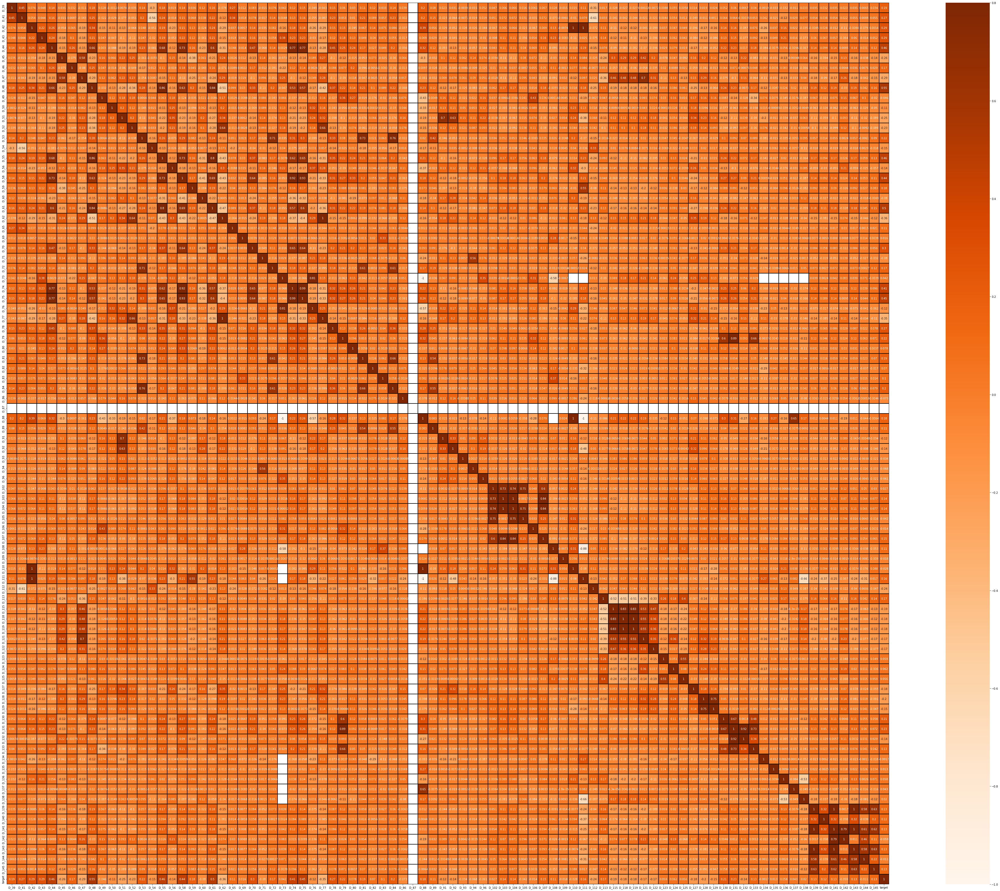

In [81]:
#plot correlation for D variables with respect to target variable
D_columns.append('target')
print(D_columns)
corr = train_df_merged[D_columns].corr(method='pearson')
plt.figure(figsize=(75,60))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Oranges',linecolor ='black')
plt.show()

**Observation:**

* D_41, D_42, D_43, D_44, D_45, D_47, D_48, D_51, D_55, D_58, D_61, D_62, D_70, D_74, D_75, D_77, D_78 appears to have favorable correlation (>=+-0.25) with target variable

---
**Q: What is the correlation for S variables with respect to target variable?**

---

['S_2', 'S_3', 'S_5', 'S_6', 'S_7', 'S_8', 'S_9', 'S_11', 'S_12', 'S_13', 'S_15', 'S_16', 'S_17', 'S_18', 'S_19', 'S_20', 'S_22', 'S_23', 'S_24', 'S_25', 'S_26', 'S_27', 'target']


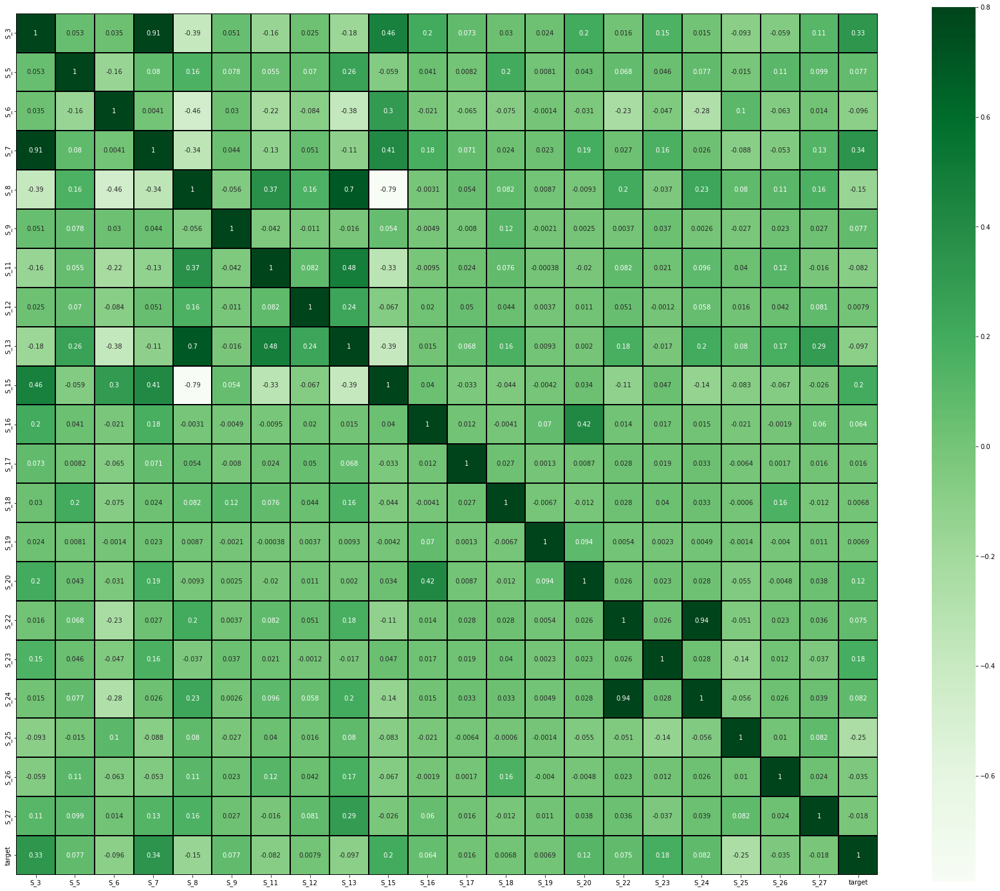

In [82]:
#plot correlation for S variables with respect to target variable
S_columns.append('target')
print(S_columns)
corr = train_df_merged[S_columns].corr(method='pearson')
plt.figure(figsize=(30,25))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Greens',linecolor ='black')
plt.show()

**Observation:**

* S_3, S_7, S_25 appears to have favorable correlation(>=+-0.25) with target variable

---
**Q: What is the correlation for P variables with respect to target variable?**

---

['P_2', 'P_3', 'P_4', 'target']


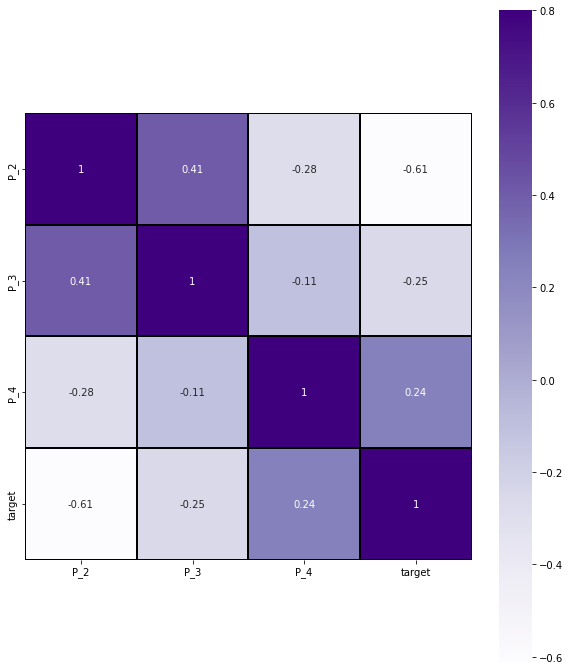

In [83]:
#plot correlation for P variables with respect to target variable
P_columns.append('target')
print(P_columns)
corr = train_df_merged[P_columns].corr(method='pearson')
plt.figure(figsize=(10,12))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Purples',linecolor ='black')
plt.show()

**Observation:**

* P_2, P_3 appears to have favorable correlation (>=+-0.25) with target variable

---
**Q: What is the correlation for B variables with respect to target variable?**

---

['B_1', 'B_2', 'B_3', 'B_4', 'B_5', 'B_6', 'B_7', 'B_8', 'B_9', 'B_10', 'B_11', 'B_12', 'B_13', 'B_14', 'B_15', 'B_16', 'B_17', 'B_18', 'B_19', 'B_20', 'B_21', 'B_22', 'B_23', 'B_24', 'B_25', 'B_26', 'B_27', 'B_28', 'B_29', 'B_30', 'B_31', 'B_32', 'B_33', 'B_36', 'B_37', 'B_38', 'B_39', 'B_40', 'B_41', 'B_42', 'target']


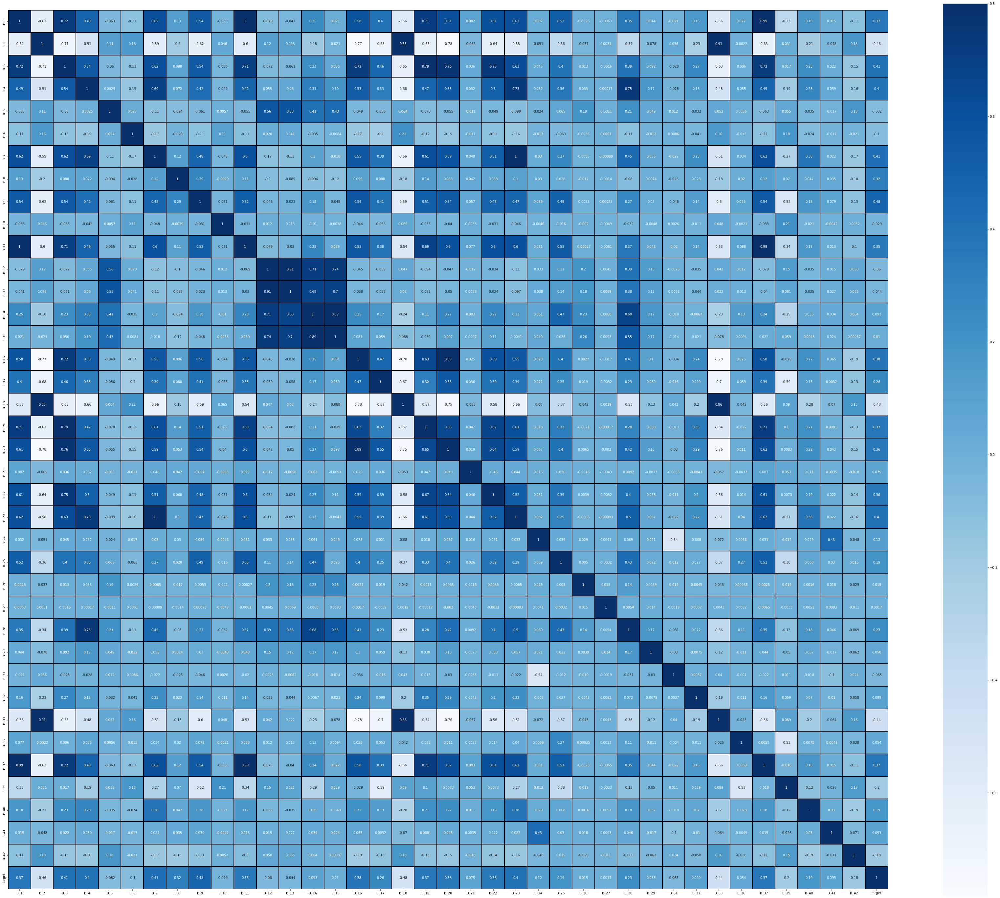

In [84]:
#plot correlation for B variables with respect to target variable
B_columns.append('target')
print(B_columns)
corr = train_df_merged[B_columns].corr(method='pearson')
plt.figure(figsize=(60,50))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Blues',linecolor ='black')
plt.show()

**Observation:**

* B_1, B_2, B_3, B_4, B_7, B_8, B_9, B_11, B_16, B_17, B_18, B_19, B_20, B_22, B_23, B_33, B_37 appears to have favorable correlation (>=+-0.25) with target variable

---
**Q: What is the correlation for R variables with respect to target variable?**

---

['R_1', 'R_2', 'R_3', 'R_4', 'R_5', 'R_6', 'R_7', 'R_8', 'R_9', 'R_10', 'R_11', 'R_12', 'R_13', 'R_14', 'R_15', 'R_16', 'R_17', 'R_18', 'R_19', 'R_20', 'R_21', 'R_22', 'R_23', 'R_24', 'R_25', 'R_26', 'R_27', 'R_28', 'target']


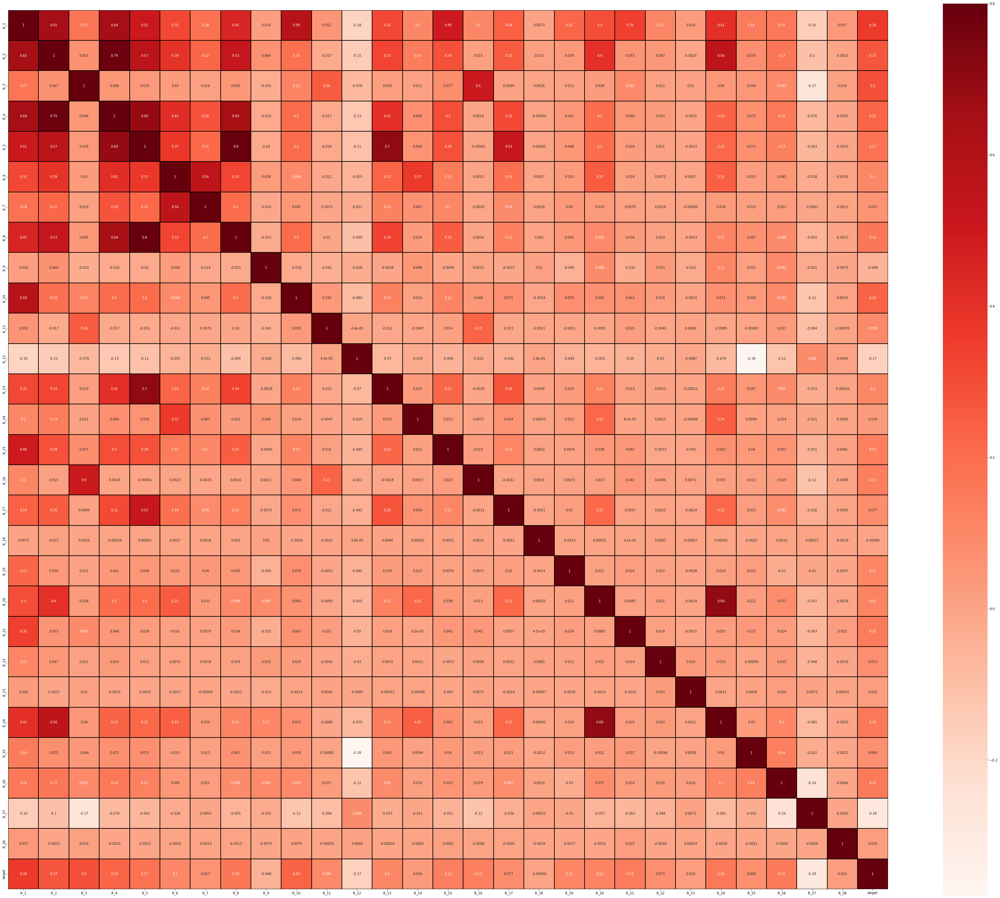

In [85]:
#plot correlation for R variables with respect to target variable
R_columns.append('target')
print(R_columns)
corr = train_df_merged[R_columns].corr(method='pearson')
plt.figure(figsize=(60,50))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Reds',linecolor ='black')
plt.show()

**Observation:**

* R_1, R_2, R_3, R_27 appears to have favorable correlation(>=+-0.25) with target variable

---
**Quick check on correlation for D, S, P, B and R variables with target variable using threshold of 0.25**

---

For D Variable

In [86]:
# check on correlation for D variable with target variable using threshold of 0.25
corr = train_df_merged.corr(method='pearson')
threshold = abs(corr['target'])
corr_result = threshold[threshold>=0.25]
corr_result.filter(like='D_').sort_values(ascending=False)

D_48    0.551759
D_61    0.501070
D_44    0.464946
D_55    0.457035
D_75    0.451118
D_58    0.442497
D_74    0.414922
D_62    0.355436
D_77    0.347415
D_70    0.300544
D_47    0.292578
D_42    0.291219
D_43    0.286885
D_78    0.271475
D_41    0.267879
D_45    0.263887
D_51    0.250491
Name: target, dtype: float64

For S Variable

In [87]:
# check on correlation for S variable with target variable using threshold of 0.20
corr = train_df_merged.corr(method='pearson')
threshold = abs(corr['target'])
corr_result = threshold[threshold>=0.25]
corr_result.filter(like='S_').sort_values(ascending=False)

S_7    0.344528
S_3    0.330204
Name: target, dtype: float64

For P Variable

In [88]:
# check on correlation for P variable with target variable using threshold of 0.25
corr = train_df_merged.corr(method='pearson')
threshold = abs(corr['target'])
corr_result = threshold[threshold>=0.25]
corr_result.filter(like='P_')

P_2    0.612638
Name: target, dtype: float64

For B Variable

In [89]:
# check on correlation for B variable with target variable using threshold of 0.25
corr = train_df_merged.corr(method='pearson')
threshold = abs(corr['target'])
corr_result = threshold[threshold>=0.25]
corr_result.filter(like='B_').sort_values(ascending=False)

B_9     0.479017
B_18    0.478104
B_2     0.464240
B_33    0.439645
B_7     0.410964
B_3     0.409356
B_23    0.404221
B_4     0.395664
B_16    0.377025
B_1     0.371901
B_37    0.367931
B_19    0.365476
B_20    0.359064
B_22    0.355214
B_11    0.352961
B_8     0.320446
B_17    0.260545
Name: target, dtype: float64

For R Variable

In [90]:
# check on correlation for R variable with target variable using threshold of 0.25
corr = train_df_merged.corr(method='pearson')
threshold = abs(corr['target'])
corr_result = threshold[threshold>=0.25]
corr_result.filter(like='R_').sort_values(ascending=False)

R_1     0.363903
R_3     0.295338
R_27    0.282676
R_2     0.272173
Name: target, dtype: float64

For D, S, P, B and R Variable

In [91]:
# check on correlation for D, S, P, B and R variable with target variable using threshold of 0.25
corr = train_df_merged.corr(method='pearson')
threshold = abs(corr['target'])
corr_result = threshold[threshold>=0.25]
corr_result.sort_values(ascending=False)

target    1.000000
P_2       0.612638
D_48      0.551759
D_61      0.501070
B_9       0.479017
B_18      0.478104
D_44      0.464946
B_2       0.464240
D_55      0.457035
D_75      0.451118
D_58      0.442497
B_33      0.439645
D_74      0.414922
B_7       0.410964
B_3       0.409356
B_23      0.404221
B_4       0.395664
B_16      0.377025
B_1       0.371901
B_37      0.367931
B_19      0.365476
R_1       0.363903
B_20      0.359064
D_62      0.355436
B_22      0.355214
B_11      0.352961
D_77      0.347415
S_7       0.344528
S_3       0.330204
B_8       0.320446
D_70      0.300544
R_3       0.295338
D_47      0.292578
D_42      0.291219
D_43      0.286885
R_27      0.282676
R_2       0.272173
D_78      0.271475
D_41      0.267879
D_45      0.263887
B_17      0.260545
D_51      0.250491
Name: target, dtype: float64

---
**Summary for some of the key numeric variable which has correlation between them and favorable correlation (>=+-0.25) with target variable**

---

Following D variables has high correlation(>=0.80) between them

* D_42 has correlation of 1.0 with D_110 and D_111
* D_58 has correlation of 0.92 with D_74 and 0.93 with D_75
* D_62 has correlation of 1.0 with D_77
* D_74 has correlation of 0.99 with D_75
* D_73 has correlation of -1.0 with D_88
* D_139 has correlation of 1.0 with D_143 and D_141
* D_141 has correlation of 1.0 with D_143
* D_132 has correlation of 0.92 with D_132
* D_48 has correlation of 0.84 with D_55 and 0.86 with D_61
* D_79 has correlation of 0.89 with D_131

Following D variables appears to have favorable correlation (>=+-0.25) with target variable

* D_48, D_61, D_44, D_55, D_75, D_58, D_74, D_62, D_77, D_70, D_47, **D_42**, D_43, D_78, D_41, D_45, D_51  

Following D variable have higher missing value:

* D_87, D_88, D_73, D_49, D_66, **D_42**, D_108, D_110, D_111, D_137, D_134, D_136, D_106,D_132, D_142 - 80%
* D_53, D_82 - 70%
* D_50, D_56 - 60%
* D_77 , D_105 - 50%

Selected D variables for further EDA

* D_61, D_44, D_55, D_75, D_62, D_70, D_47, D_43, D_78, D_41, D_45, D_51

---

Following S variables has high correlation(>=0.80) between them

* S_3 has correlation of 0.91 with S_7
* S_22 has correlation of 0.94 with S_24

Following S variables appears to have favorable correlation (>=+-0.25) with target variable

* S_7, S_3 

Following S variable have higher missing value:

* S_9 - 70%

Selected S variables for further EDA

* S_7


---


Following P variables has high correlation(>=0.80) between them

* None of the P variables appears to be highly correlated

Following P variables appears to have favorable correlation (>=+-0.25) with target variable

* P_2

None of the P variable have higher missing value

Selected P variable for further EDA

* P_2

---

Following B variables has high correlation(>=0.80) between them

* B_1 has correlation of 0.99 with B_37
* B_1 has correlation of 1.0 with B_11
* B_2 has correlation of 0.91 with B_33
* B_2 has correlation of 0.85 with B_18
* B_11 has correlation of 0.99 with B_37
* B_12 has correlation of 0.91 with B_13
* B_14 has correlation of 0.89 with B_15
* B_7 has correlation of 1.0 with B_23

Following B variables appears to have favorable correlation (>=+-0.25) with target variable

* B_9, B_18, B_2, B_33, B_7, B_3, B_23, B_4, B_16, B_1, B_37, B_19, B_20, B_22, B_11, B_8, **B_17**

Following B variable have higher missing value:

* B_39, B_42, B_29 - 80%
* **B_17** - 50%

Selected B variables for further EDA

* B_9, B_18, B_33, B_7, B_3, B_4, B_16, B_1, B_19, B_20, B_22, B_8

---

Following R variables has high correlation(>=0.80) between them

* R_4 has correlation of 0.79 with R_2
* R_5 has correlation of 0.8 with R_8

Following R variables appears to have favorable correlation (>=+-0.25) with target variable

* R_1, R_3, R_27, R_2

Following R variable have higher missing value:

* R_9, R_26 - 80%

Selected R variables for further EDA

* R_1, R_3, R_27, R_2

---

---
**Lets look at distribution for selected D, S, P, B, R variables with respect to target variable**

---

---
**Q: What is the distribution for selected D variables with respect to target variable?**

---

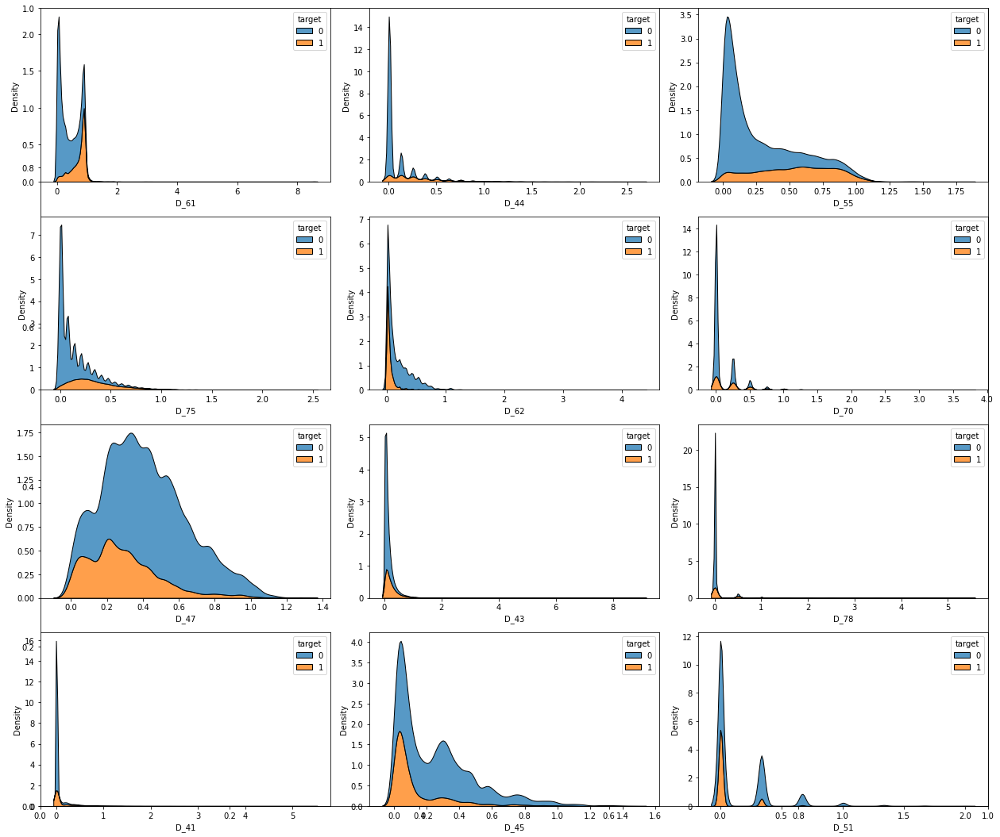

In [92]:
#plot distribution for selected D variables with respect to target label
nrows = 4
ncols = 3
fig, axes = plt.subplots(figsize=(18,15)) 
d_columns=['D_61','D_44','D_55','D_75','D_62','D_70','D_47','D_43','D_78','D_41','D_45', 'D_51']
for i, col in enumerate(d_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.kdeplot(x=train_df_merged[col], hue=train_df_merged['target'], multiple="stack",ax=ax)
    
fig.tight_layout()  
plt.show()

---
**Q: What is the distribution for selected S variables with respect to target variable?**

---

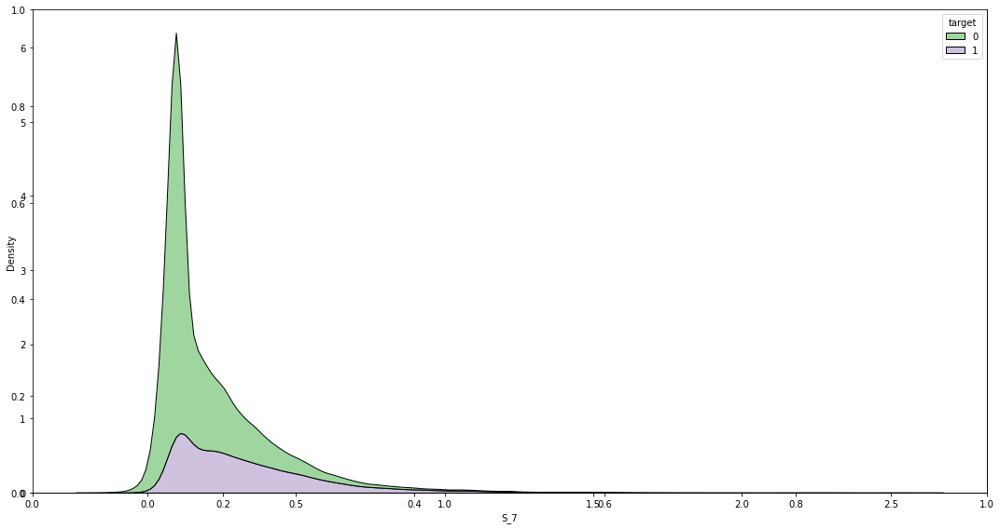

In [93]:
#plot distribution for selected S variables with respect to target label
nrows = 1
ncols = 1
fig, axes = plt.subplots(figsize=(15,8)) 
s_columns=['S_7']
for i, col in enumerate(s_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.kdeplot(x=train_df_merged[col], hue=train_df_merged['target'], multiple="stack",palette="Accent",ax=ax)
    
fig.tight_layout()  
plt.show()

---
**Q: What is the distribution for selected P variable with respect to target variable?**

---

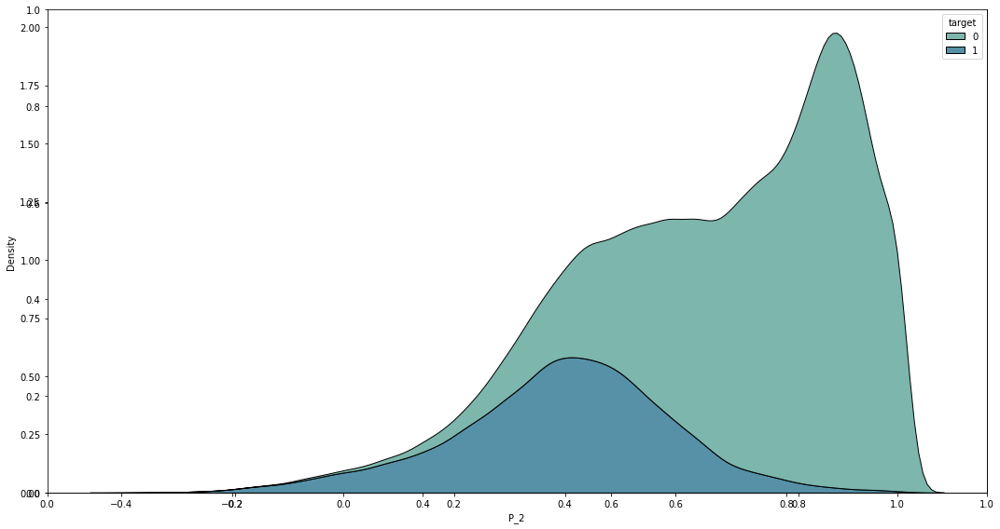

In [94]:
#plot distribution for selected P variable with respect to target label
nrows = 1
ncols = 1
fig, axes = plt.subplots(figsize=(15,8)) 
p_columns=['P_2']
for i, col in enumerate(p_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.kdeplot(x=train_df_merged[col], hue=train_df_merged['target'], multiple="stack",palette="crest",ax=ax)
    
fig.tight_layout()  
plt.show()

---
**Q: What is the distribution for selected B variables with respect to target variable?**

---

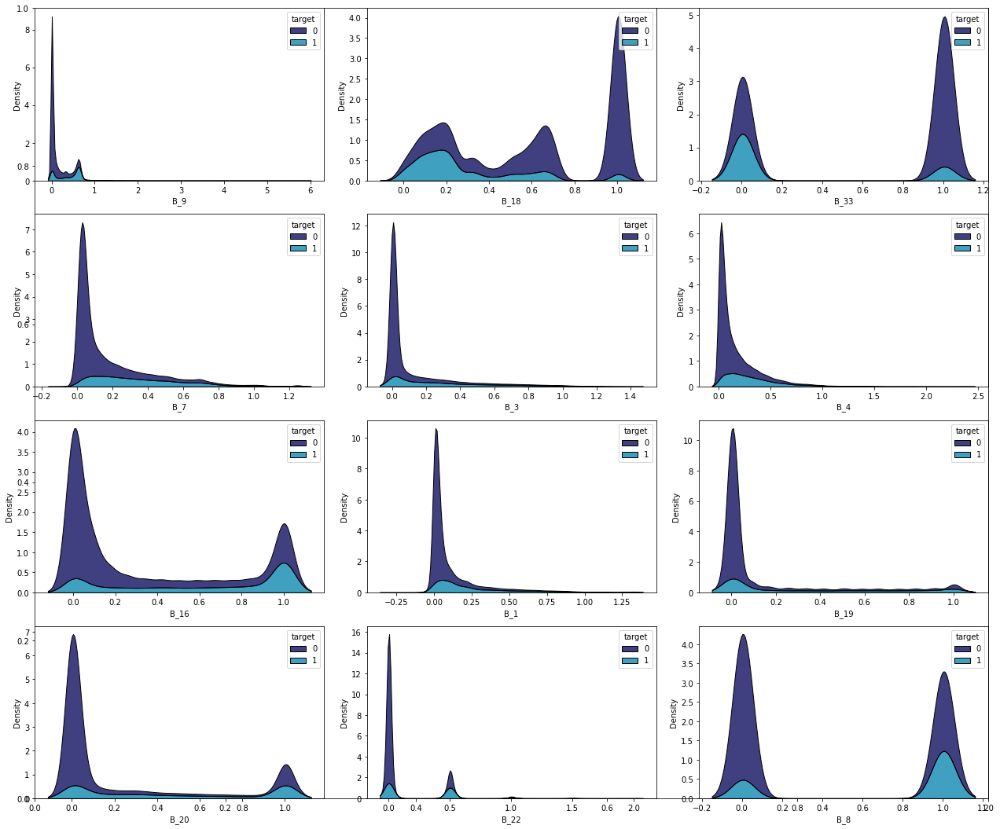

In [95]:
#plot distribution for selected B variables with respect to target label
nrows = 4
ncols = 3
fig, axes = plt.subplots(figsize=(18,15)) 
b_columns=['B_9','B_18','B_33','B_7','B_3','B_4','B_16','B_1','B_19','B_20','B_22', 'B_8']
for i, col in enumerate(b_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.kdeplot(x=train_df_merged[col], hue=train_df_merged['target'], multiple="stack",palette="ocean",ax=ax)
    
fig.tight_layout()  
plt.show()

---
**Q: What is the distribution for selected R variables with respect to target variable?**

---

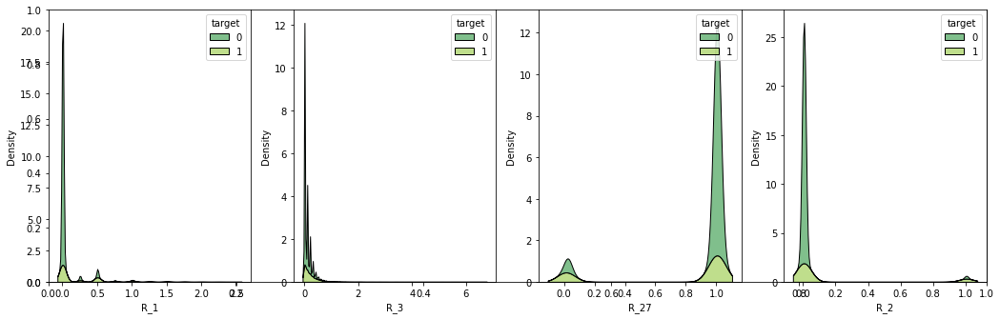

In [96]:
#plot distribution for selected R variables with respect to target label
nrows = 1
ncols = 4
fig, axes = plt.subplots(figsize=(15,5)) 
r_columns=['R_1','R_3','R_27','R_2']
for i, col in enumerate(r_columns):
    ax=fig.add_subplot(nrows, ncols, i+1)
    sns.kdeplot(x=train_df_merged[col], hue=train_df_merged['target'], multiple="stack",palette="summer",ax=ax)
    
fig.tight_layout()  
plt.show()

---
**Lets look at trend for D_61, S_7, P_2, B_9 and R_1 variable with respect to target variable**

---

---
**Q: What is the trend for D_61 variable with respect to target variable?**

---

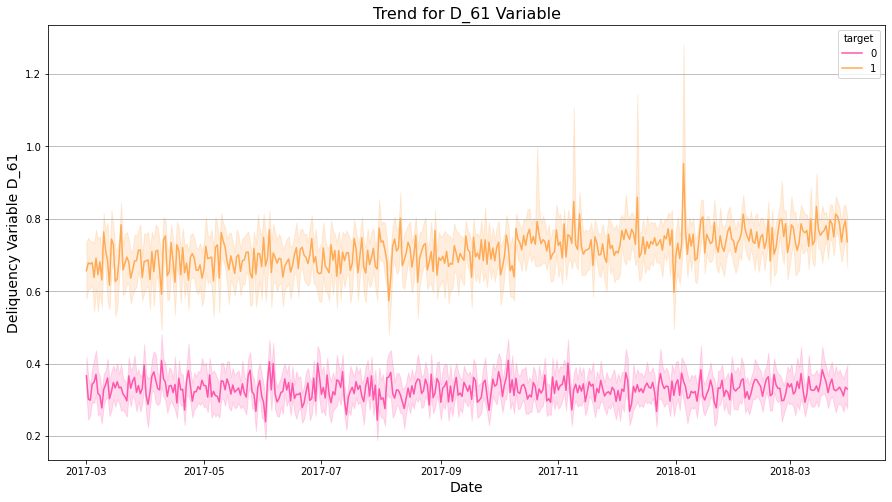

In [97]:
# trend for D_61 variable
plt.figure(figsize=(15,8))
sns.lineplot(data = train_df_merged, x = 'S_2', y = 'D_61', hue= 'target', palette='spring')
plt.xlabel('Date', size = 14)
plt.ylabel('Deliquency Variable D_61', size = 14)
plt.title('Trend for D_61 Variable', size = 16)
plt.grid(visible = True, axis = 'y')
plt.show()

**Observation:**

* Above plot shows trend for Deliquency variable D_61 with respect to date S_2 and datapoints with target=1(Default) appears to have  higher Deliquency value.

---
**Q: What is the trend for S_7 variable with respect to target variable?**

---

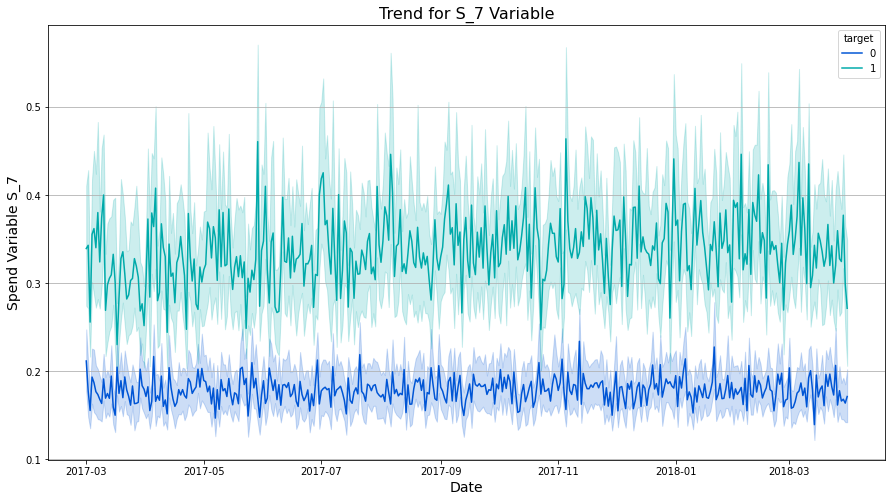

In [98]:
# trend for S_7 variable
plt.figure(figsize=(15,8))
sns.lineplot(data = train_df_merged, x = 'S_2', y = 'S_7', hue= 'target', palette='winter')
plt.xlabel('Date', size = 14)
plt.ylabel('Spend Variable S_7', size = 14)
plt.title('Trend for S_7 Variable', size = 16)
plt.grid(visible = True, axis = 'y')
plt.show()

**Observation:**

* Above plot shows trend for Spend variable S_7 with respect to date S_2 and datapoints with target=1(Default) appears to have higher Spend value.

---
**Q: What is the trend for P_2 variable with respect to target variable?**

---

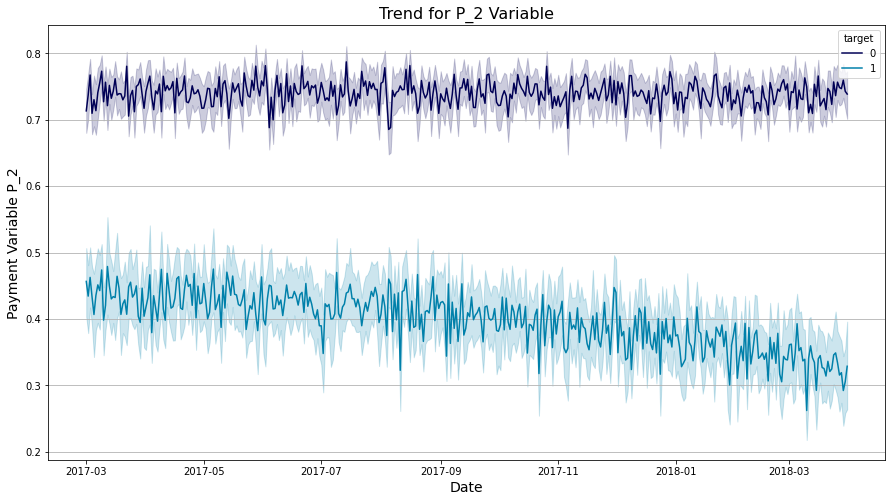

In [99]:
# trend for P_2 variable
plt.figure(figsize=(15,8))
sns.lineplot(data = train_df_merged, x = 'S_2', y = 'P_2', hue= 'target', palette='ocean')
plt.xlabel('Date', size = 14)
plt.ylabel('Payment Variable P_2', size = 14)
plt.title('Trend for P_2 Variable', size = 16)
plt.grid(visible = True, axis = 'y')
plt.show()

**Observation:**

* Above plot shows trend for Payment variable P_2 with respect to date S_2 and datapoints with target=1(Default) appears to have lower Payment value.

---
**Q: What is the trend for B_9 variable with respect to target variable?**

---

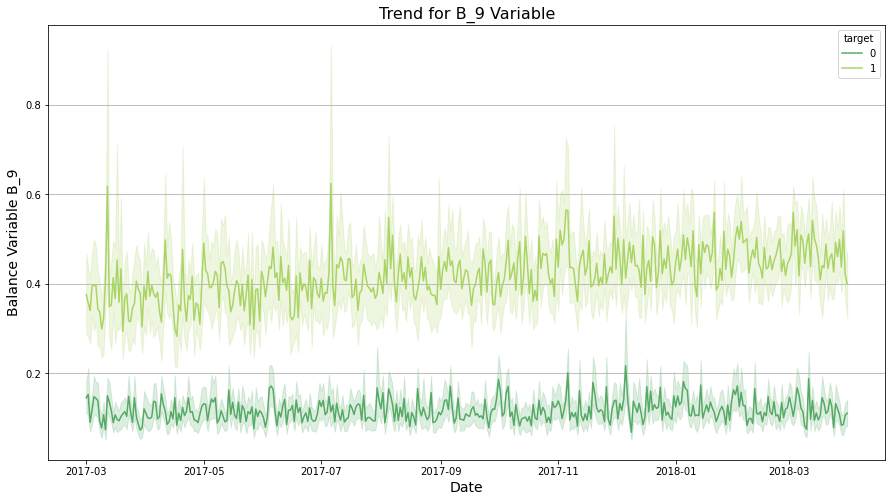

In [100]:
# trend for B_9 variable
plt.figure(figsize=(15,8))
sns.lineplot(data = train_df_merged, x = 'S_2', y = 'B_9', hue= 'target', palette='summer')
plt.xlabel('Date', size = 14)
plt.ylabel('Balance Variable B_9', size = 14)
plt.title('Trend for B_9 Variable', size = 16)
plt.grid(visible = True, axis = 'y')
plt.show()

**Observation:**

* Above plot shows trend for Balance variable B_9 with respect to date S_2 and datapoints with target=1(Default) appears to have higher Balance value.

---
**Q: What is the trend for R_1 variable with respect to target variable?**

---

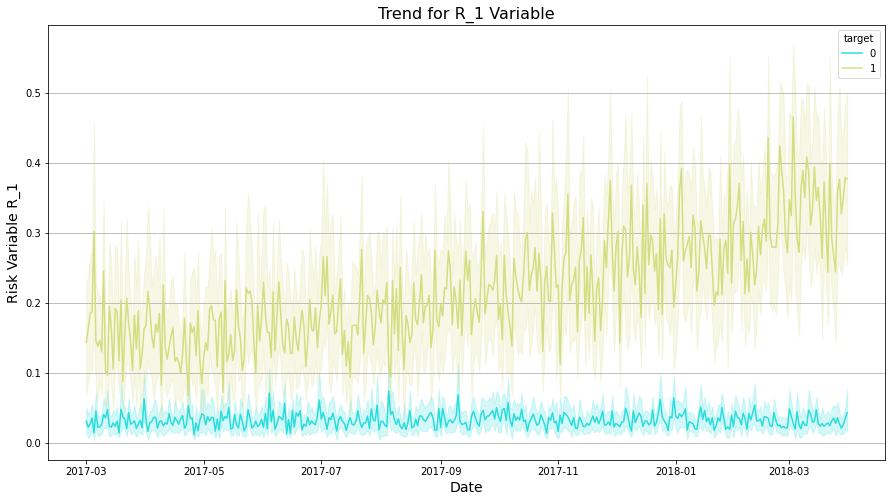

In [101]:
# trend for R_1 variable
plt.figure(figsize=(15,8))
sns.lineplot(data = train_df_merged, x = 'S_2', y = 'R_1', hue= 'target', palette='rainbow')
plt.xlabel('Date', size = 14)
plt.ylabel('Risk Variable R_1', size = 14)
plt.title('Trend for R_1 Variable', size = 16)
plt.grid(visible = True, axis = 'y')
plt.show()

**Observation:**

* Above plot shows trend for Risk variable R_1 with respect to date S_2 and datapoints with target=1(Default) appears to have higher Risk value.

---
**Lets look at distribution for categorical variables with respect to target variable**

---

Following are the variables with categorical data:

* B_30, B_38, D_114, D_116, D_117, D_120, D_126, D_63, D_64, **D_66**, D_68

Note: Will skip **D_66** variable as it has 88.9% of value as nan

---
**Q: What is the distribution for B_30 variable with respect to target variable?**

---

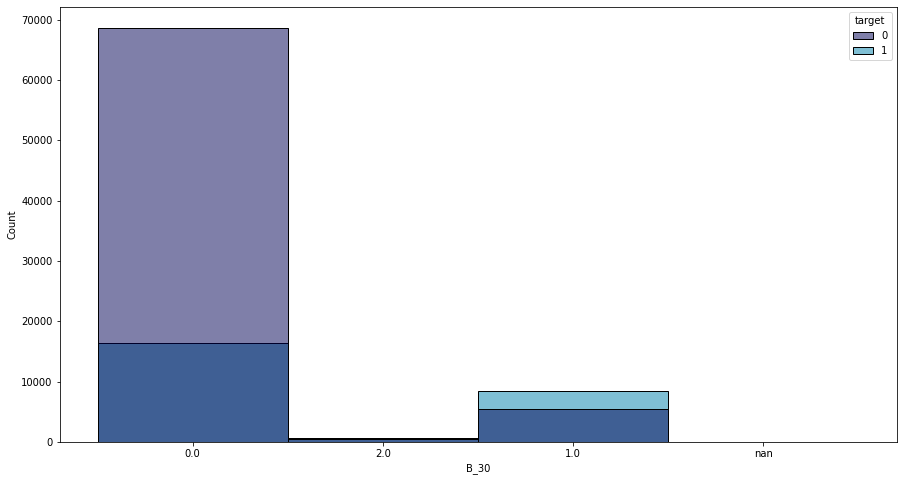

In [102]:
# plot distribution of B_30 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='B_30',hue='target', palette='ocean',element='bars')
plt.show()

**Observation:**

* Above plot shows B_30 variable distribution with respect to target variable and "0.0" and "1.0" category has majority of distribution which appears to overlap with target variable with target=0(Not Default) as majority. "1.0" category has target=1(Default) as majority.

---
**Q: What is the distribution for B_38 variable with respect to target variable?**

---

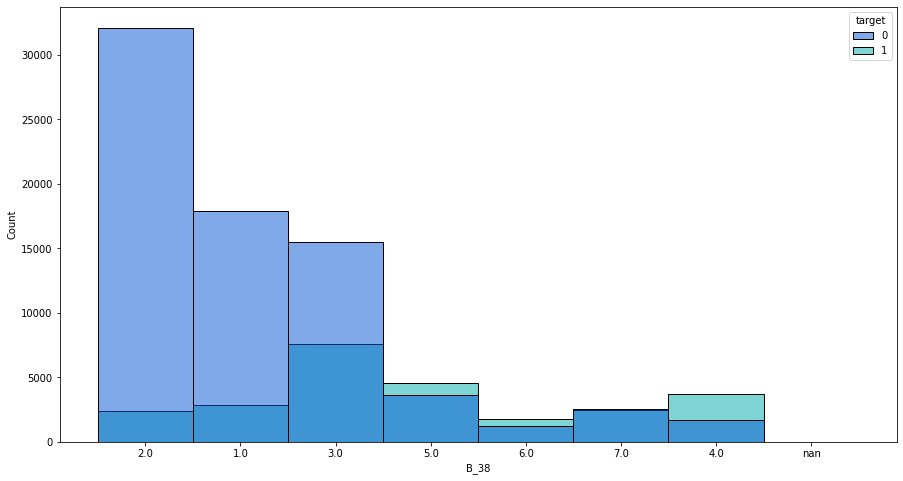

In [103]:
# plot distribution of B_38 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='B_38',hue='target', palette='winter',element='bars')
plt.show()

**Observation:**

* Above plot shows B_38 variable distribution with respect to target variable and "2.0", "1.0" and "3.0" category has majority of distribution which appears to overlap for target variable with target=0(Not Default) as majority. "4.0" category is having target=1(Default) as majority with "7.0" category which appears to share both target=0(Not Default) and target=1(Default) equally.

---
**Q: What is the distribution for D_63 variable with respect to target variable?**

---

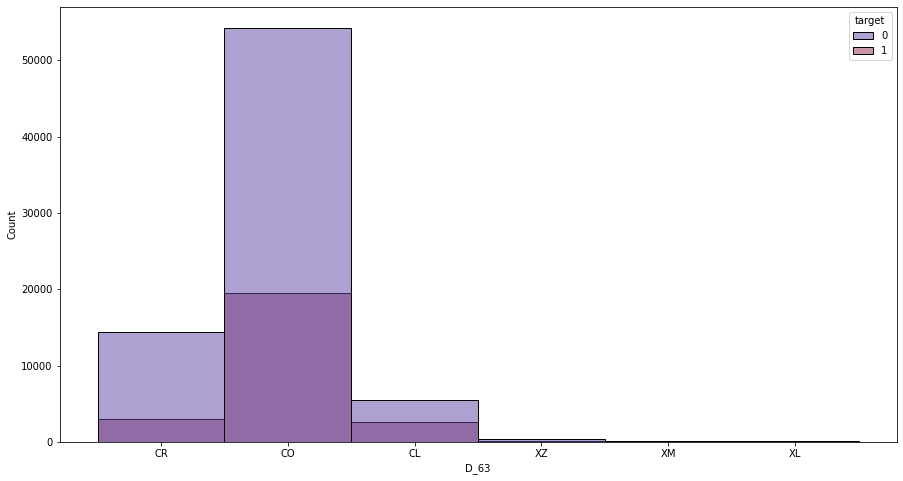

In [104]:
# plot distribution of D_63 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_63',hue='target', palette='twilight',element='bars')
plt.show()

**Observation:**

* Above plot shows D_63 variable distribution with respect to target variable and "CO", "CR" and "CL" category has majority of distribution which appears to overlap for target variable with target=0(Not Default) as majority.

---
**Q: What is the distribution for D_64 variable with respect to target variable?**

---

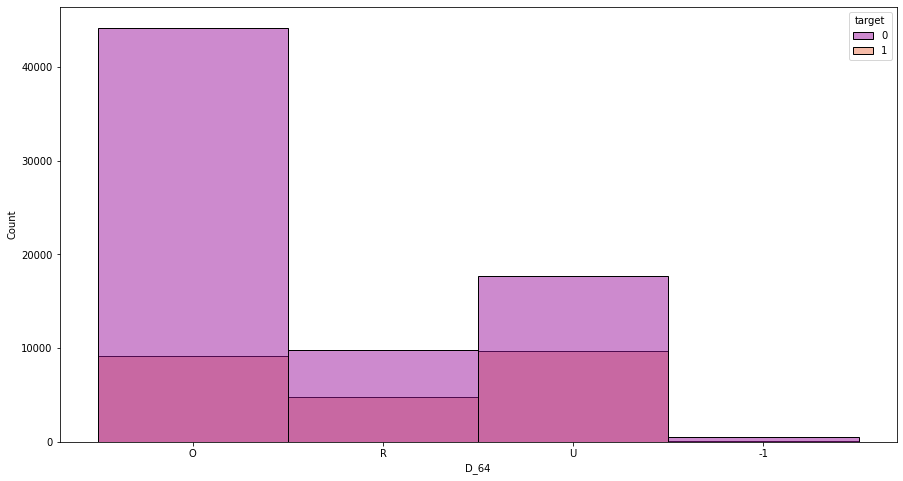

In [105]:
# plot distribution of D_64 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_64',hue='target', palette='plasma',element='bars')
plt.show()

**Observation:**

* Above plot shows D_64 variable distribution with respect to target variable and "O", "R" and "U" category has majority of distribution which appears to overlap for target variable with target=0(Not Default) as majority.

---
**Q: What is the distribution for D_68 variable with respect to target variable?**

---

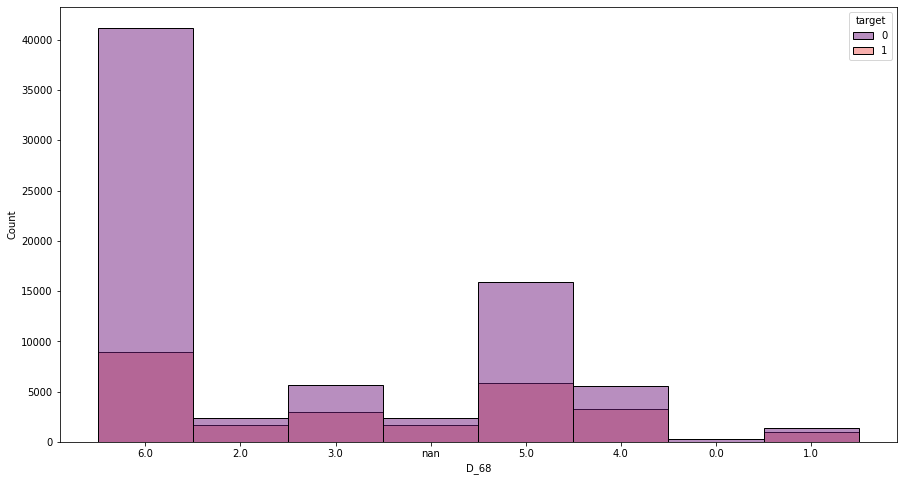

In [106]:
# plot distribution of D_68 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_68',hue='target', palette='magma',element='bars')
plt.show()

**Observation:**

* Above plot shows D_68 variable distribution with respect to target variable and "6.0" and "5.0" category has majority of distribution which appears to overlap for target variable followed by "3.0", "4.0", "2.0" and "1.0" category with target=0(Not Default) as majority.

---
**Q: What is the distribution for D_114 variable with respect to target variable?**

---

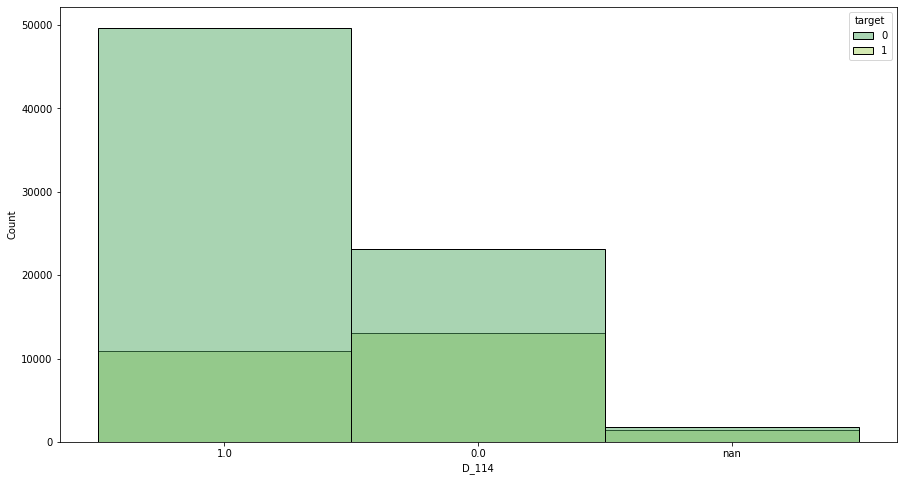

In [107]:
# plot distribution of D_114 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_114',hue='target', palette='summer',element='bars')
plt.show()

**Observation:**

* Above plot shows D_114 variable distribution with respect to target variable and "1.0" category has majority of distribution which appears to overlap for target variable followed by "0.0" category with target=0(Not Default) as majority.

---
**Q: What is the distribution for D_116 variable with respect to target variable?**

---

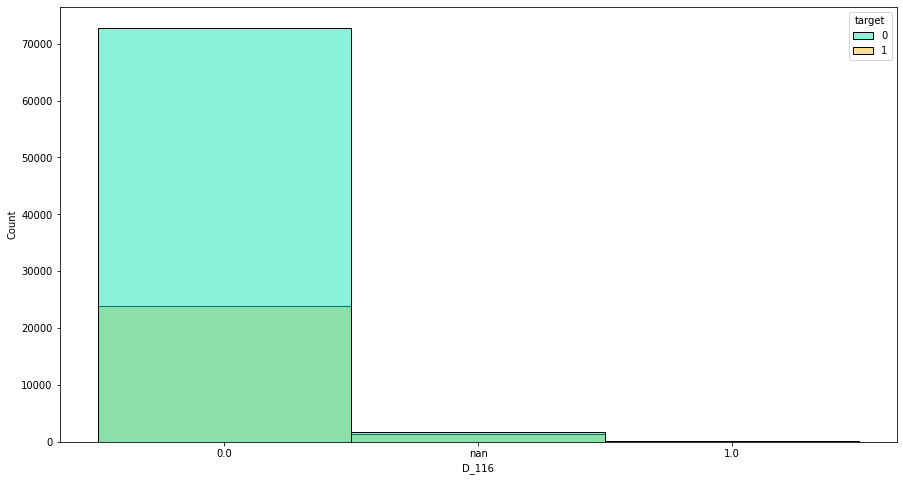

In [108]:
# plot distribution of D_116 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_116',hue='target', palette='turbo',element='bars')
plt.show()

**Observation:**

* Above plot shows D_116 variable distribution with respect to target variable and "0.0" category has majority of distribution which appears to overlap for target variable with target=0(Not Default) as majority.

---
**Q: What is the distribution for D_117 variable with respect to target variable?**

---

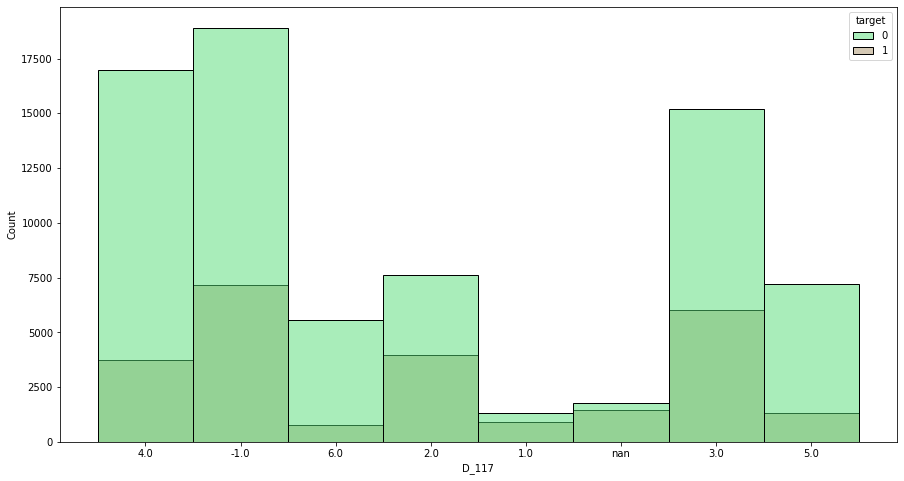

In [109]:
# plot distribution of D_117 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_117',hue='target', palette='terrain',element='bars')
plt.show()

**Observation:**

* Above plot shows D_117 variable distribution with respect to target variable and "-1.0", "4.0" and "3.0" category has majority of distribution which appears to overlap for target variable followed by "2.0", "5.0", "6.0" and "1.0" category with target=0(Not Default) as majority in all of them.

---
**Q: What is the distribution for D_120 variable with respect to target variable?**

---

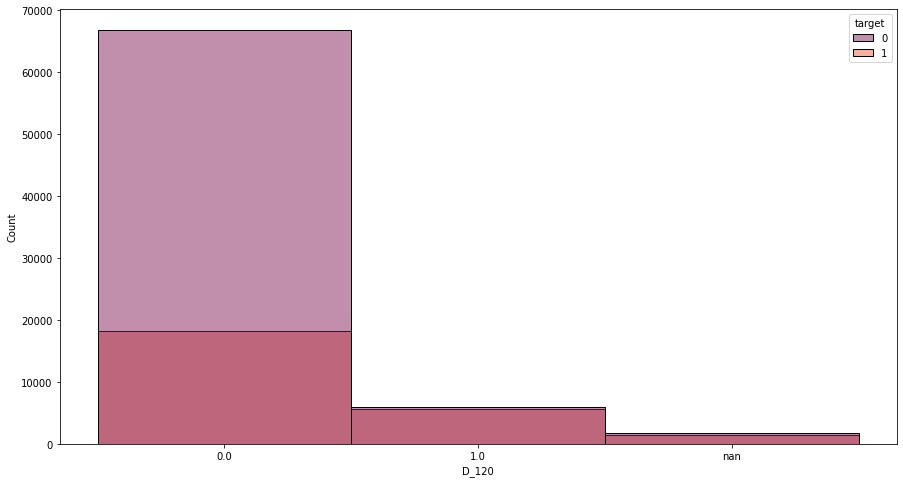

In [110]:
# plot distribution of D_120 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_120',hue='target', palette='rocket',element='bars')
plt.show()

**Observation:**

* Above plot shows D_120 variable distribution with respect to target variable and "0.0" category has majority of distribution which appears to overlap for target variable with target=0(Not Default) as majority followed by "1.0" which appears to share both target=0(Not Default) and target=1(Default) equally.

---
**Q: What is the distribution for D_126 variable with respect to target variable?**

---

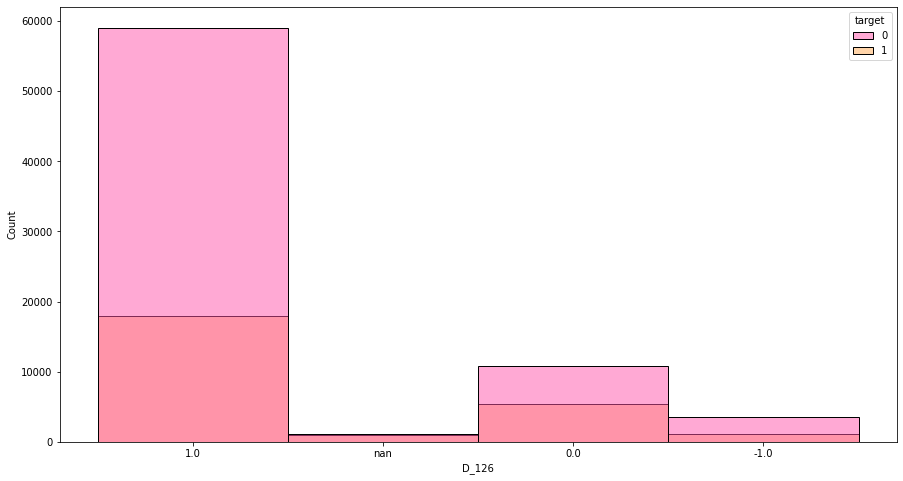

In [111]:
# plot distribution of D_126 variable with respect to target variable
plt.figure(figsize=(15,8))
sns.histplot(data=train_df_merged,x='D_126',hue='target', palette='spring',element='bars')
plt.show()

**Observation:**

* Above plot shows D_126 variable distribution with respect to target variable and "1.0" category has majority of distribution which appears to overlap for target variable with target=0(Not Default) as majority followed by "0.0" and "-1.0" category.

---
**Lets try to look at correlation for categorical variables between them and with respect to target variable**

---

Encoding categorical variables

In [112]:
# encode categorical columns 
train_df_merged=pd.get_dummies(train_df_merged,columns=['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64','D_68'])

---
Considering high number of encoded categorical variables, need to extract names of variable for easy access.

---

In [113]:
# extract encoded column names
# regex to capture column name with B_$$_ (excluding column name with suffix nan)
b_col1 = "B_[0-9][0-9]_[^nan]"
# regex to capture column name with D_$$_ (excluding column name with suffix nan)
d_col1 = "D_[0-9][0-9]_[^nan]"
# regex to capture column name with D_$$$_ (excluding column name with suffix nan)
d_col2 = "D_[0-9][0-9][0-9]_[^nan]"
B_cat_columns1 = [col for col in train_df_merged.columns if re.match(b_col1,col)]
print ("Total number of cat columns starting with B is", len(B_cat_columns1))
print(B_cat_columns1)
print("###############################")
D_cat_columns1 = [col for col in train_df_merged.columns if re.match(d_col1,col)]
print ("Total number of first set of cat columns starting with D is", len(D_cat_columns1))
print(D_cat_columns1)
print("###############################")
D_cat_columns2 = [col for col in train_df_merged.columns if re.match(d_col2,col)]
print ("Toal number of second set of cat columns starting with D is", len(D_cat_columns2))
print(D_cat_columns2)
print("###############################")
total_cat_columns = len(B_cat_columns1)+len(D_cat_columns1)+len(D_cat_columns2)
print("Total new cat columns",total_cat_columns)

Total number of cat columns starting with B is 10
['B_30_0.0', 'B_30_1.0', 'B_30_2.0', 'B_38_1.0', 'B_38_2.0', 'B_38_3.0', 'B_38_4.0', 'B_38_5.0', 'B_38_6.0', 'B_38_7.0']
###############################
Total number of first set of cat columns starting with D is 17
['D_63_CL', 'D_63_CO', 'D_63_CR', 'D_63_XL', 'D_63_XM', 'D_63_XZ', 'D_64_-1', 'D_64_O', 'D_64_R', 'D_64_U', 'D_68_0.0', 'D_68_1.0', 'D_68_2.0', 'D_68_3.0', 'D_68_4.0', 'D_68_5.0', 'D_68_6.0']
###############################
Toal number of second set of cat columns starting with D is 16
['D_114_0.0', 'D_114_1.0', 'D_116_0.0', 'D_116_1.0', 'D_117_-1.0', 'D_117_1.0', 'D_117_2.0', 'D_117_3.0', 'D_117_4.0', 'D_117_5.0', 'D_117_6.0', 'D_120_0.0', 'D_120_1.0', 'D_126_-1.0', 'D_126_0.0', 'D_126_1.0']
###############################
Total new cat columns 43


---
**Q: What is the correlation for encoded categorical variables?**

---

['B_30_0.0', 'B_30_1.0', 'B_30_2.0', 'B_38_1.0', 'B_38_2.0', 'B_38_3.0', 'B_38_4.0', 'B_38_5.0', 'B_38_6.0', 'B_38_7.0', 'D_63_CL', 'D_63_CO', 'D_63_CR', 'D_63_XL', 'D_63_XM', 'D_63_XZ', 'D_64_-1', 'D_64_O', 'D_64_R', 'D_64_U', 'D_68_0.0', 'D_68_1.0', 'D_68_2.0', 'D_68_3.0', 'D_68_4.0', 'D_68_5.0', 'D_68_6.0', 'D_114_0.0', 'D_114_1.0', 'D_116_0.0', 'D_116_1.0', 'D_117_-1.0', 'D_117_1.0', 'D_117_2.0', 'D_117_3.0', 'D_117_4.0', 'D_117_5.0', 'D_117_6.0', 'D_120_0.0', 'D_120_1.0', 'D_126_-1.0', 'D_126_0.0', 'D_126_1.0']


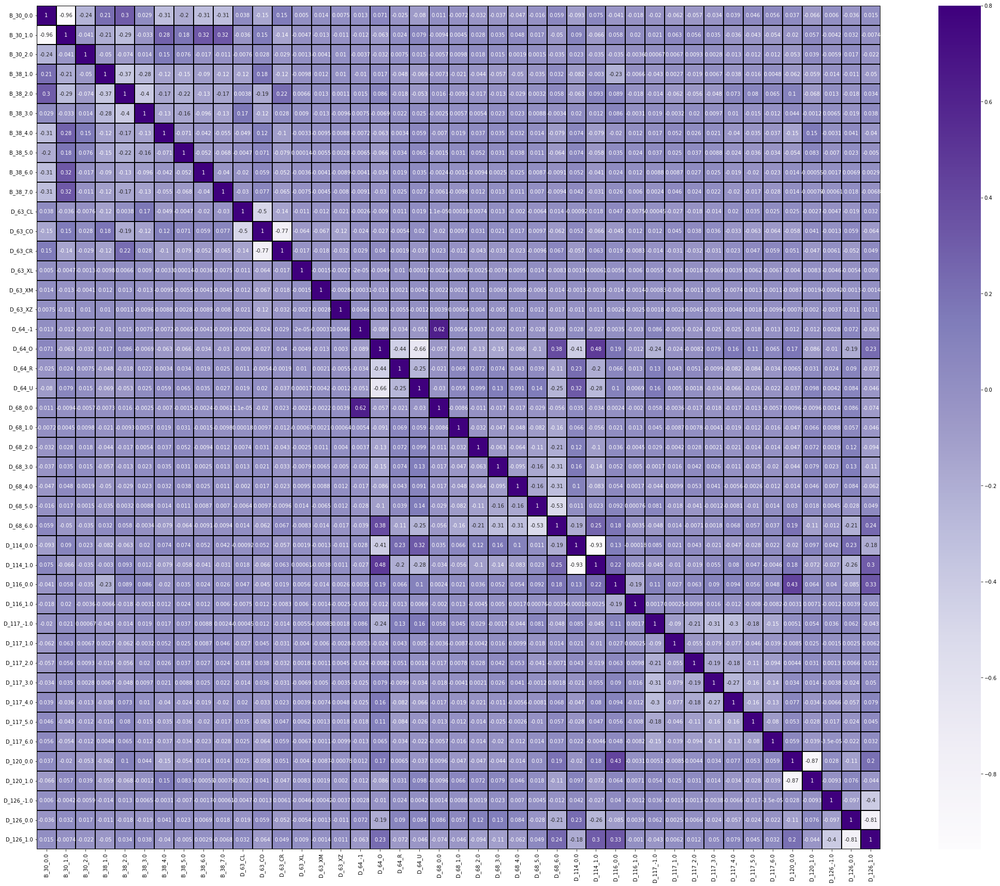

In [114]:
# plot correlation between categorical variables (columns)
new_cat_columns=B_cat_columns1+D_cat_columns1+D_cat_columns2
print(new_cat_columns)
corr = train_df_merged[new_cat_columns].corr(method='pearson')
plt.figure(figsize=(40,30))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Purples',linecolor ='black')
plt.show()

**Observation:**

* B_30_0.0 and B_30_1.0 has correlation of -0.96
* D_63_CR and D_63_CO has correlation of -0.77
* D_114_0.0 and D_114_1.0 has correlation of -0.93
* D_120_0.0 and D_120_1.0 has correlation of -0.87
* D_126_0.0 and D_126_1.0 has correlation of -0.81

---
**Q: What is the correlation for encoded categorical variables with respect to target variable?**

---

['B_30_0.0', 'B_30_1.0', 'B_30_2.0', 'B_38_1.0', 'B_38_2.0', 'B_38_3.0', 'B_38_4.0', 'B_38_5.0', 'B_38_6.0', 'B_38_7.0', 'D_63_CL', 'D_63_CO', 'D_63_CR', 'D_63_XL', 'D_63_XM', 'D_63_XZ', 'D_64_-1', 'D_64_O', 'D_64_R', 'D_64_U', 'D_68_0.0', 'D_68_1.0', 'D_68_2.0', 'D_68_3.0', 'D_68_4.0', 'D_68_5.0', 'D_68_6.0', 'D_114_0.0', 'D_114_1.0', 'D_116_0.0', 'D_116_1.0', 'D_117_-1.0', 'D_117_1.0', 'D_117_2.0', 'D_117_3.0', 'D_117_4.0', 'D_117_5.0', 'D_117_6.0', 'D_120_0.0', 'D_120_1.0', 'D_126_-1.0', 'D_126_0.0', 'D_126_1.0', 'target']


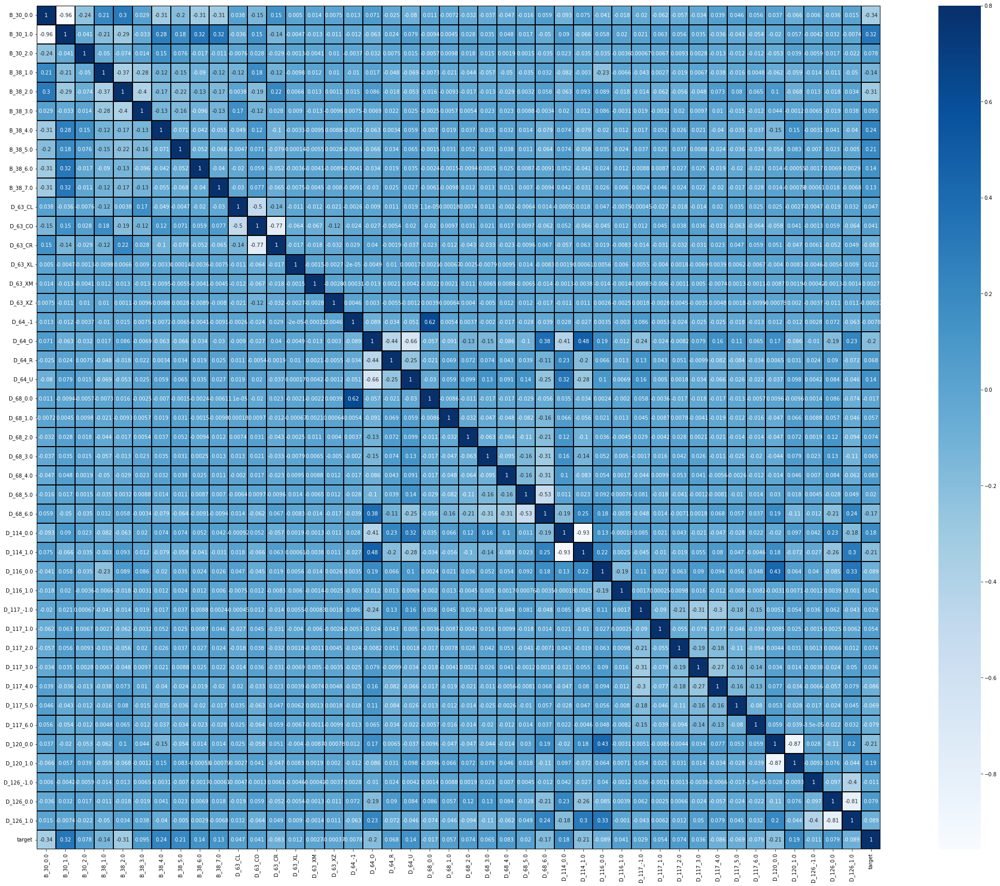

In [115]:
# plot correlation between categorical columns with respect to target variable
new_cat_columns=B_cat_columns1+D_cat_columns1+D_cat_columns2
new_cat_columns.append('target')
print(new_cat_columns)
corr = train_df_merged[new_cat_columns].corr(method='pearson')
plt.figure(figsize=(40,30))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='Blues',linecolor ='black')
plt.show()

**Observation:**

* Few category (encoded columns) in B_30, B_38, D_64, D_114 and D_120 variable appears to have favorable correlation with target variable.

In [116]:
# check on correlation for categorical variable with target variable using threshold of 0.15
corr = train_df_merged[new_cat_columns].corr(method='pearson')
threshold = abs(corr['target'])
corr_result = threshold[threshold>=0.15]
corr_result.sort_values(ascending=False)

target       1.000000
B_30_0.0     0.335696
B_30_1.0     0.323263
B_38_2.0     0.307040
B_38_4.0     0.240386
D_120_0.0    0.214796
D_114_1.0    0.209380
B_38_5.0     0.206099
D_64_O       0.202166
D_120_1.0    0.193171
D_114_0.0    0.182856
D_68_6.0     0.173705
Name: target, dtype: float64

---
# Summary

---

* Dataset is imbalanced with target=1(Default) as 25.9% and target=0(Not Default) as 74.1% 
* D_* Variable category has the highest number of variable 92 out of 189 variable (excluding customer_ID)
* B_* Variable category has the second highest of variable as 40
* R_* Variable category is the third highest with 28 variable
* S_* Variable category has 22 number of variable
* P_* Variable category has 3 variables
* All the variable category has variables with missing value and outliers
* All the variable category has variables with skewed or bimodal distribution
* There are variable category (D,B and S) which has highly correlated variables.

---
* **D_* = Delinquency variable category**

---
**Total Number of Variable:** 92

* Number of Variable with dtype float64: 90

* Number of Variable with dtype int64: 0

* Number of Variable with dtype object: 2

   * Number of Variable with Categorical Data: 9

   * Number of Variable with Missing Value: 81

---
* **S_* = Spend variable category**

---

**Total Number of Variable:** 22

* Number of Variable with dtype float64: 21

* Number of Variable with dtype int64: 0

* Number of Variable with dtype object: 1 (Date)

    * Number of Variable with Categorical Data: None

    * Number of Variable with Missing Value: 13

---
* **P_* = Payment variable category**

---

**Total Number of Variable:** 3

* Number of Variable with dtype float64: 3

* Number of Variable with dtype int64: 0

* Number of Variable with dtype object: 0

    * Number of Variable with Categorical Data: None

    * Number of Variable with Missing Value: 2

---
* **B_* = Balance variable category**

---

**Total Number of Variable:** 40

* Number of Variable with dtype float64: 39

* Number of Variable with dtype int64: 1

* Number of Variable with dtype object: 0

    * Number of Variable with Categorical Data: 2

    * Number of Variable with Missing Value: 19

---
* **R_* = Risk variable category**

---

**Total Number of Variable:** 28

* Number of Variable with dtype float64: 28

* Number of Variable with dtype int64: 0

* Number of Variable with dtype object: 0

    * Number of Variable with Categorical Data: None

    * Number of Variable with Missing Value: 4

---

Based on EDA, following variables can be considered for next steps

* D_41, D_43, D_44, D_45, D_47, D_51, D_55, D_61, D_62, **D_64**, D_70, D_75, D_78, **D_114, D_120**

* S_7

* P_2

* B_1, B_3, B_4, B_7, B_8, B_9, B_16, B_18, B_19, B_20, B_22, **B_30**, B_33, **B_38**

* R_1, R_2, R_3, R_27

---
# Next Steps

---

* **For Model building and Prediction**

    * Dataset is of large size and requires appropriate handling
        * Usage of Dask or using compressed file format (Parquet or Feather)
        * Using reduced size of training dataset is also an option
    * Imbalance in training dataset will require handling
        * Usage of SMOTE along with combination of oversampling and undersampling
    * Variables with Missing value needs handling
        * Variables with significant missing value (>= 80%) can be dropped
        * Variables with missing value (20%) needs imputation
    * Variables with high correlation (Multicollinearity) needs handling
        * Variables (D, S, P, B, R) with high positive or negative correlation (>= 0.8) can be filtered
    * Variables (D, S, P, B, R) having favorable correlation (>=+-0.25) with target variable should be preferred
    * Categorical Variables requires encoding along with detailed correlation check with respect to target variable
    * Feature Engineering mechanism appropriate for this dataset need to be explored
    * Dimensionality Reduction via PCA can help reduce number of variables as needed
    * Feature Importance mechanism can help select appropriate variable
    * Standardization of variables will ensure same level of scale for model training/evaluation
    
https://www.kaggle.com/code/girishkumarsahu/american-express-default-prediction-ml-model

---
**Thank you and Happy Learning.**

---

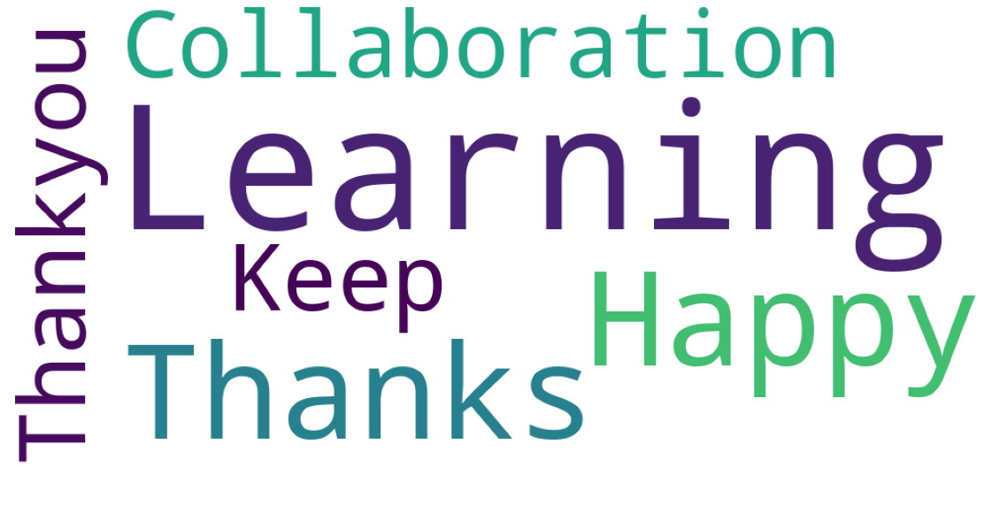

In [117]:
thank_you_str="Thanks,Happy Learning,Collaboration,Thankyou,Keep Learning"
# create WordCloud with converted string
wordcloud = WordCloud(width = 1000, height = 500, random_state=1, background_color='white', collocations=True).generate(thank_you_str)
plt.figure(figsize=(20, 20))
plt.imshow(wordcloud) 
plt.axis("off")
plt.show()